In [4]:
# Add imports
import urllib
import networkx as nx
import io
import json
import re
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import random
import pandas as pd
import seaborn as sns
import matplotlib.colors as mcolors
import numpy as np
from itertools import islice
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
import numpy as np
import urllib.request
import json
import os
import string
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import re
from wordcloud import *

In [5]:
# Load the network
url = "https://raw.githubusercontent.com/denisababeii/socialgraphs_project/refs/heads/main/celebrities_clean_without_content.graphml"
    
try:
    with urllib.request.urlopen(url) as response:
        data = response.read()
        
    network = nx.read_graphml(io.BytesIO(data))
    print(f"✓ Network loaded successfully!")
    print(f"  Nodes: {network.number_of_nodes()}")
    print(f"  Edges: {network.number_of_edges()}")
        
except Exception as e:
    print(f"✗ Error loading network: {str(e)}")
    network = None

✓ Network loaded successfully!
  Nodes: 11286
  Edges: 125705


In [36]:
first_node = list(network.nodes())[0]

# View its attributes
print(f"First node: {first_node}")
print(f"Attributes: {network.nodes[first_node]}")

# Or to see it more nicely formatted
print(f"\nFirst node: {first_node}")
for key, value in network.nodes[first_node].items():
    print(f"  {key}: {value}")

First node: 0
Attributes: {'Name': 'Alexander I of Yugoslavia', 'NameURL': 'Alexander_I_of_Yugoslavia', 'Link': 'https://en.wikipedia.org/wiki/Alexander_I_of_Yugoslavia', 'birthcity': 'CETINJE', 'countryName': nan, 'continentName': 'EUROPE', 'birthyear': 1888.0, 'deathyear': 1934.0, 'gender': 'Male', 'occupation': 'POLITICIAN', 'industry': 'GOVERNMENT'}

First node: 0
  Name: Alexander I of Yugoslavia
  NameURL: Alexander_I_of_Yugoslavia
  Link: https://en.wikipedia.org/wiki/Alexander_I_of_Yugoslavia
  birthcity: CETINJE
  countryName: nan
  continentName: EUROPE
  birthyear: 1888.0
  deathyear: 1934.0
  gender: Male
  occupation: POLITICIAN
  industry: GOVERNMENT


I grouped nodes by birth cities and sorted the groups by the number of influential people coming from that city.

In [6]:
# Group nodes by birth city
from collections import defaultdict

city_groups = defaultdict(list)

for node in network.nodes():
    birth_city = network.nodes[node].get('birthcity', 'Unknown')
    city_groups[birth_city].append(node)

# Print summary
print(f"Total unique birth cities: {len(city_groups)}\n")

# Show top 10 cities by number of people
sorted_cities = sorted(city_groups.items(), key=lambda x: len(x[1]), reverse=True)

print("Top 10 cities by number of people:")
for i, (city, people) in enumerate(sorted_cities[:10], 1):
    print(f"{i:2d}. {city:30s} - {len(people):4d} people")
    # Show first 3 people from this city
    for person in people[:3]:
        print(f"     - {person}")
    if len(people) > 3:
        print(f"     ... and {len(people) - 3} more")
    print()

Total unique birth cities: 5074

Top 10 cities by number of people:
 1. OTHER                          -  505 people
     - 37
     - 197
     - 451
     ... and 502 more

 2. NEW YORK                       -  338 people
     - 8844
     - 8845
     - 8846
     ... and 335 more

 3. PARIS                          -  244 people
     - 1631
     - 1642
     - 1669
     ... and 241 more

 4. LOS ANGELES                    -  190 people
     - 8691
     - 8692
     - 8693
     ... and 187 more

 5. LONDON                         -  177 people
     - 919
     - 944
     - 947
     ... and 174 more

 6. ROME                           -  170 people
     - 3954
     - 3973
     - 3977
     ... and 167 more

 7. CHICAGO                        -  107 people
     - 8729
     - 8730
     - 8732
     ... and 104 more

 8. MOSCOW                         -  104 people
     - 5927
     - 5930
     - 5935
     ... and 101 more

 9. ISTANBUL                       -   76 people
     - 1208
     - 7173
  

In [38]:
len(sorted_cities)

5074

I discarder the 'OTHER' option which was the one with the most people and kept only cities where more than 5 influential people come from - this leading to 279 cities to analyse.

In [7]:
top_cities = sorted_cities[1:280]

print(f"Top 10 cities (total: {len(top_cities)})")
for i, (city, people) in enumerate(top_cities, 1):
    print(f"{i:2d}. {city:30s} - {len(people):4d} people")

Top 10 cities (total: 279)
 1. NEW YORK                       -  338 people
 2. PARIS                          -  244 people
 3. LOS ANGELES                    -  190 people
 4. LONDON                         -  177 people
 5. ROME                           -  170 people
 6. CHICAGO                        -  107 people
 7. MOSCOW                         -  104 people
 8. ISTANBUL                       -   76 people
 9. VIENNA                         -   74 people
10. BOSTON                         -   65 people
11. BERLIN                         -   63 people
12. SAN FRANCISCO-BAY AREA         -   62 people
13. SAINT PETERSBURG               -   52 people
14. FLORENCE                       -   50 people
15. BUENOS AIRES                   -   43 people
16. MADRID                         -   43 people
17. MUNICH                         -   42 people
18. BUDAPEST                       -   38 people
19. STOCKHOLM                      -   38 people
20. COPENHAGEN                     -   37 

In [8]:
# Define eras with their time ranges
def get_era(birth_year):
    """Determine which era a birth year belongs to"""
    if birth_year is None:
        return 'Unknown'
    
    try:
        year = int(birth_year)
    except (ValueError, TypeError):
        return 'Unknown'
    
    if year < 30:
        return 'Before Christ (< 30)'
    elif 30 <= year < 476:
        return 'Classical Era (30-476)'
    elif 476 <= year < 1450:
        return 'Middle Ages (476-1450)'
    elif 1450 <= year < 1760:
        return 'Early Modern (1450-1760)'
    elif 1760 <= year < 1840:
        return 'Industrial Era (1760-1840)'
    elif 1840 <= year < 1945:
        return 'Wartime (1840-1945)'
    elif 1945 <= year <= 2025:
        return 'Post-War (1945-2025)'
    else:
        return 'Unknown'

# Group people by city and era
city_era_groups = {}

for city, people in top_cities:
    city_era_groups[city] = defaultdict(list)
    
    for person in people:
        birth_year = network.nodes[person].get('birthyear', None)
        era = get_era(birth_year)
        city_era_groups[city][era].append(person)

# Display results
print("People grouped by city and era:\n")
for i, (city, people) in enumerate(top_cities[:10], 1):  # Show first 10 cities
    print(f"{i}. {city} ({len(people)} total people)")
    print("-" * 60)
    
    era_dict = city_era_groups[city]
    
    # Sort eras chronologically
    era_order = [
        'Before Christ (< 30)',
        'Classical Era (30-476)',
        'Middle Ages (476-1450)',
        'Early Modern (1450-1760)',
        'Industrial Era (1760-1840)',
        'Wartime (1840-1945)',
        'Post-War (1945-2035)',
        'Unknown'
    ]
    
    for era in era_order:
        if era in era_dict and len(era_dict[era]) > 0:
            print(f"  {era:30s}: {len(era_dict[era]):4d} people")
            # Show first 2 people from this era
            for person in era_dict[era][:2]:
                birth_year = network.nodes[person].get('birthyear', 'N/A')
                print(f"     - {person} (born {birth_year})")
            if len(era_dict[era]) > 2:
                print(f"     ... and {len(era_dict[era]) - 2} more")
    
    print()

People grouped by city and era:

1. NEW YORK (338 total people)
------------------------------------------------------------
  Early Modern (1450-1760)      :    1 people
     - 10356 (born 1745.0)
  Industrial Era (1760-1840)    :    3 people
     - 10324 (born 1819.0)
     - 10500 (born 1823.0)
     ... and 1 more
  Wartime (1840-1945)           :  177 people
     - 8846 (born 1936.0)
     - 8847 (born 1940.0)
     ... and 175 more

2. PARIS (244 total people)
------------------------------------------------------------
  Middle Ages (476-1450)        :   15 people
     - 1669 (born 1401.0)
     - 1684 (born 1403.0)
     ... and 13 more
  Early Modern (1450-1760)      :   49 people
     - 1675 (born 1550.0)
     - 1676 (born 1619.0)
     ... and 47 more
  Industrial Era (1760-1840)    :   50 people
     - 1677 (born 1803.0)
     - 1768 (born 1809.0)
     ... and 48 more
  Wartime (1840-1945)           :   97 people
     - 1631 (born 1859.0)
     - 1642 (born 1895.0)
     ... and 95 m

In [9]:
# Create summary statistics
summary_data = []

for city, people in top_cities:
    era_dict = city_era_groups[city]
    
    for era, era_people in era_dict.items():
        summary_data.append({
            'city': city,
            'era': era,
            'count': len(era_people)
        })

df_summary = pd.DataFrame(summary_data)

# Pivot to show cities vs eras
df_pivot = df_summary.pivot(index='city', columns='era', values='count').fillna(0).astype(int)

# Reorder columns chronologically
era_order = [
    'Before Christ (< 30)',
    'Classical Era (30-476)',
    'Middle Ages (476-1450)',
    'Early Modern (1450-1760)',
    'Industrial Era (1760-1840)',
    'Wartime (1840-1945)',
    'Post-War (1945-2025)',
    'Unknown'
]

df_pivot = df_pivot[[col for col in era_order if col in df_pivot.columns]]

print(df_pivot.head(10))

era         Before Christ (< 30)  Classical Era (30-476)  \
city                                                       
ABIDJAN                        0                       0   
ACCRA                          0                       0   
ADELAIDE                       0                       0   
AJACCIO                        0                       0   
ALBANY                         0                       0   
ALEXANDRIA                     7                       8   
AMSTERDAM                      0                       0   
ANTWERP                        0                       0   
AREZZO                         1                       0   
ATHENS                        20                       3   

era         Middle Ages (476-1450)  Early Modern (1450-1760)  \
city                                                           
ABIDJAN                          0                         0   
ACCRA                            0                         0   
ADELAIDE               

Heatmap shows the distribuiton of people by city and era in the cities with the most influential people.

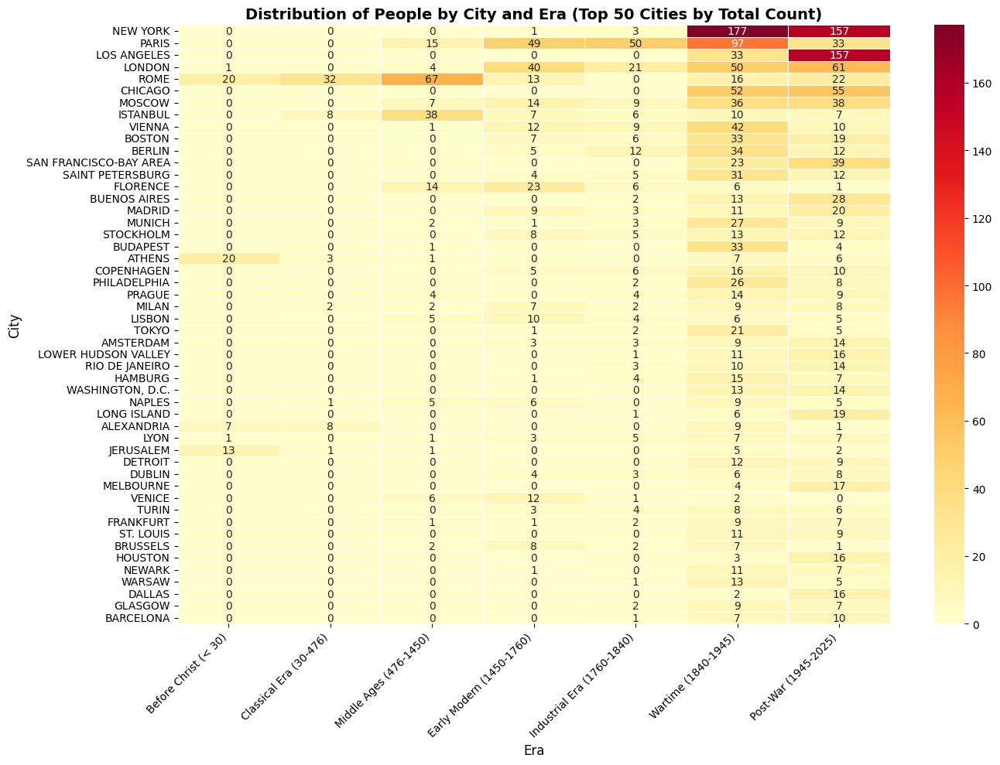

In [10]:
# Heatmap of top cities sorted by total people count
# Sort the pivot table by total count across all eras
df_pivot_sorted = df_pivot.copy()
df_pivot_sorted['total'] = df_pivot_sorted.sum(axis=1)
df_pivot_sorted = df_pivot_sorted.sort_values('total', ascending=False)
df_pivot_sorted = df_pivot_sorted.drop('total', axis=1)

# Plot top 50 cities
plt.figure(figsize=(14, 10))
sns.heatmap(df_pivot_sorted.head(50), annot=True, fmt='d', cmap='YlOrRd', linewidths=0.5)
plt.title('Distribution of People by City and Era (Top 50 Cities by Total Count)', 
          fontsize=14, fontweight='bold')
plt.xlabel('Era', fontsize=12)
plt.ylabel('City', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

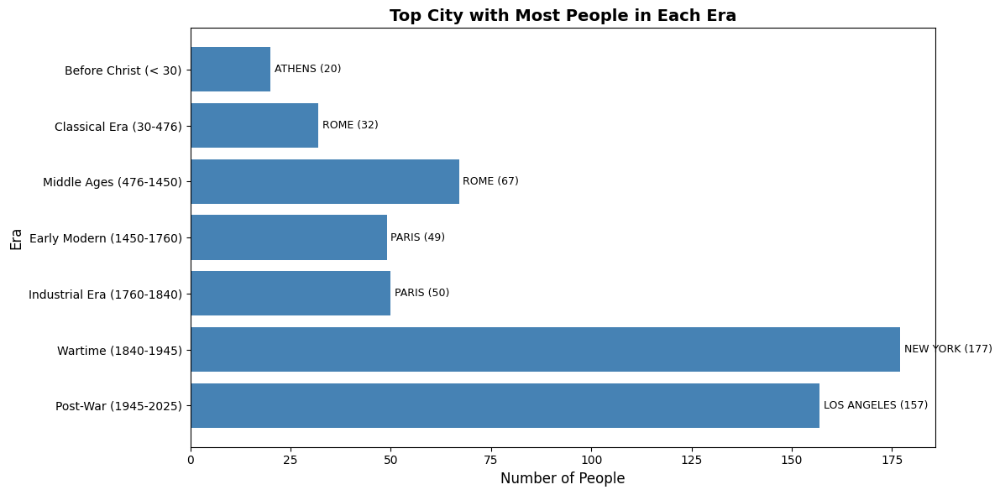

In [11]:
# Create visualization of top city per era
top_cities_per_era = []

for era in era_order:
    if era in df_pivot.columns and df_pivot[era].max() > 0:
        top_city = df_pivot[era].idxmax()
        top_count = df_pivot[era].max()
        top_cities_per_era.append({
            'era': era,
            'city': top_city,
            'count': top_count
        })

df_top = pd.DataFrame(top_cities_per_era)

# Plot
plt.figure(figsize=(12, 6))
bars = plt.barh(df_top['era'], df_top['count'], color='steelblue')

# Add city names on the bars
for i, (era, city, count) in enumerate(zip(df_top['era'], df_top['city'], df_top['count'])):
    plt.text(count + 1, i, f'{city} ({count})', va='center', fontsize=9)

plt.xlabel('Number of People', fontsize=12)
plt.ylabel('Era', fontsize=12)
plt.title('Top City with Most People in Each Era', fontsize=14, fontweight='bold')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

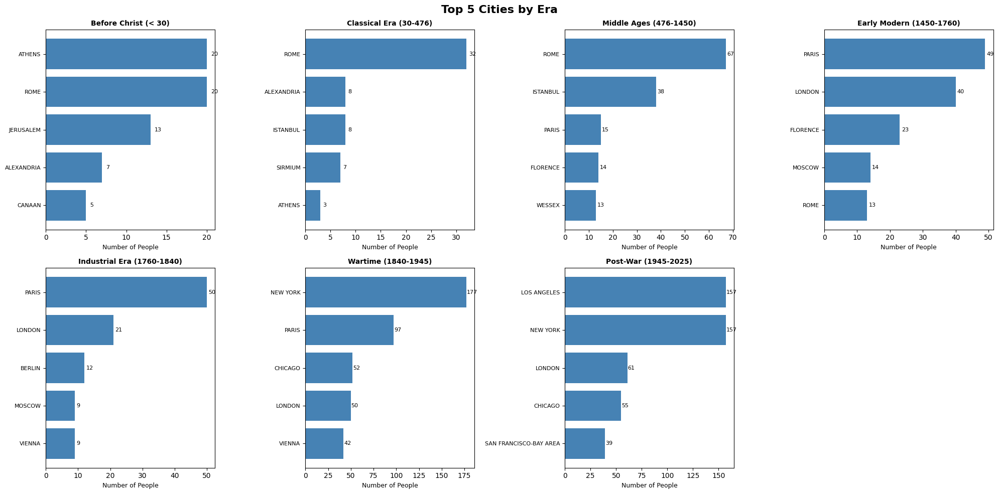

In [12]:
# Create grouped bar chart for top 5 cities per era
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for idx, era in enumerate([e for e in era_order if e in df_pivot.columns and df_pivot[e].max() > 0]):
    # Get top 5 cities for this era
    top_5 = df_pivot[era].nlargest(5)
    
    ax = axes[idx]
    ax.barh(range(len(top_5)), top_5.values, color='steelblue')
    ax.set_yticks(range(len(top_5)))
    ax.set_yticklabels(top_5.index, fontsize=8)
    ax.set_xlabel('Number of People', fontsize=9)
    ax.set_title(f'{era}', fontsize=10, fontweight='bold')
    ax.invert_yaxis()
    
    # Add count labels on bars
    for i, v in enumerate(top_5.values):
        ax.text(v + 0.5, i, str(int(v)), va='center', fontsize=8)

# Hide unused subplots
for idx in range(len([e for e in era_order if e in df_pivot.columns and df_pivot[e].max() > 0]), len(axes)):
    axes[idx].axis('off')

plt.suptitle('Top 5 Cities by Era', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

**Sentiment analysis**

In [ ]:
# nx.set_node_attributes(network, "", "sentiment")

In [ ]:
# def parse_labmt_file(file_content):
#     """
#     Parse LabMT word list file and return dictionary of word -> happiness score.
    
#     Args:
#         file_content: String content of the LabMT file
        
#     Returns:
#         dict: Dictionary mapping words to their happiness_average scores
#     """
#     word_scores = {}
#     lines = file_content.strip().split('\n')
    
#     # Skip header lines (first 3 lines)
#     for line in lines[3:]:
#         parts = line.split('\t')
#         if len(parts) >= 3:
#             word = parts[0].strip()
#             try:
#                 happiness_avg = float(parts[2].strip())
#                 word_scores[word] = happiness_avg
#             except ValueError:
#                 continue
    
#     return word_scores


# with open('/Volumes/MASTER/Year1/Social_graphs/dataset.txt', 'r', encoding='utf-8') as f:
#     labmt_content = f.read()
# word_scores = parse_labmt_file(labmt_content)

In [ ]:
# def calculate_sentiment(tokens):
#     sum = 0
#     len = 0
#     for token in tokens:
#         if token in word_scores:
#             sum = sum + word_scores[token]
#             len+=1
#     return sum / len

In [ ]:
# def clean_tokenize_lemmatize_nltk(text):
#     """
#     Clean, tokenize, and lemmatize text from Wikipedia JSON files.
    
#     Args:
#         text: Raw text content (can be JSON string or plain text)
    
#     Returns:
#         list: List of cleaned and lemmatized tokens
#     """
#     # If input is JSON string, extract the wikitext content
#     if isinstance(text, str) and text.strip().startswith('{'):
#         try:
#             data = json.loads(text)
#             # Navigate through the JSON structure to get wikitext
#             pages = data.get('query', {}).get('pages', {})
#             # Get the first (and usually only) page
#             page_content = next(iter(pages.values()))
#             text = page_content.get('revisions', [{}])[0].get('slots', {}).get('main', {}).get('*', '')
#         except (json.JSONDecodeError, KeyError, StopIteration):
#             pass  # If parsing fails, treat as plain text
    
#     # Remove MediaWiki markup
#     # Remove {{templates}}
#     text = re.sub(r'\{\{[^}]*\}\}', '', text)
#     # Remove [[links]] but keep the text
#     text = re.sub(r'\[\[(?:[^|\]]*\|)?([^\]]+)\]\]', r'\1', text)
#     # Remove HTML tags
#     text = re.sub(r'<[^>]+>', '', text)
#     # Remove reference tags like <ref>...</ref>
#     text = re.sub(r'<ref[^>]*>.*?</ref>', '', text, flags=re.DOTALL)
#     # Remove URLs
#     text = re.sub(r'https?://\S+', '', text)
#     # Remove file/image references
#     text = re.sub(r'\[\[File:.*?\]\]|\[\[Image:.*?\]\]', '', text, flags=re.IGNORECASE)
    
#     # Convert to lowercase
#     text = text.lower()
    
#     # Remove punctuation but keep spaces
#     text = text.translate(str.maketrans(string.punctuation, ' ' * len(string.punctuation)))
    
#     # Tokenize
#     tokens = word_tokenize(text)
    
#     # Remove stopwords and very short tokens
#     stop_words = set(stopwords.words('english'))
#     tokens = [token for token in tokens if token not in stop_words and len(token) > 2]
    
#     # Lemmatize
#     lemmatizer = WordNetLemmatizer()
#     tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
#     # Remove any remaining non-alphabetic tokens
#     tokens = [token for token in tokens if token.isalpha()]

#     # Remove all occurrences of 'nbsp' and 'also' - noticed after testing
#     tokens = [token for token in tokens if token not in {'nbsp', 'also', 'align', 'center', 'nugent', 'ncategory', 'text', 'nin', 'parser', 'output', 'hlist', 'html', 'navbox', 'font', 'sidebar', 'infobox'}]
    
#     return tokens

I had to remove some nodes because the sentiment analysis was taking a lot of time for all the nodes. I kept the nodes which had the birthcity as one of the top 100 cities with most influential people.

In [ ]:
# # Create a new network with only nodes from top 100 cities
# print("Creating filtered network with top 100 cities...")

# # Get nodes from top 100 cities
# nodes_to_keep = set()
# for city, people in top_cities[:100]:
#     nodes_to_keep.update(people)

# print(f"  Top 100 cities contain {len(nodes_to_keep)} nodes")

# # Create subgraph with only these nodes
# network_top100 = network.subgraph(nodes_to_keep).copy()

# print(f"\n✓ Filtered network created!")
# print(f"  Original network: {network.number_of_nodes()} nodes, {network.number_of_edges()} edges")
# print(f"  Top 100 cities network: {network_top100.number_of_nodes()} nodes, {network_top100.number_of_edges()} edges")

# # Update top_cities to only include the 100 cities
# top_cities_100 = top_cities[:100]

# # Rebuild city_era_groups for top 100 cities only
# city_era_groups_100 = {}

# for city, people in top_cities_100:
#     city_era_groups_100[city] = defaultdict(list)
    
#     for person in people:
#         birth_year = network_top100.nodes[person].get('birthyear', None)
#         era = get_era(birth_year)
#         city_era_groups_100[city][era].append(person)

# full_network = network
# full_top_cities = top_cities
# full_city_era_groups = city_era_groups
# # Use these for sentiment calculation
# network = network_top100
# top_cities = top_cities_100
# city_era_groups = city_era_groups_100

Creating filtered network with top 100 cities...
  Top 100 cities contain 3422 nodes

✓ Filtered network created!
  Original network: 11286 nodes, 125705 edges
  Top 100 cities network: 3422 nodes, 17581 edges


In [ ]:
# # Calculate sentiment for each city-era pair
# from collections import defaultdict

# # First, calculate sentiment for each node using the Link attribute
# print("Calculating sentiment for each person...")

# node_sentiments = {}
# errors = []

# for i, node in enumerate(network.nodes(), 1):
#     if i % 100 == 0:
#         print(f"  Processed {i}/{network.number_of_nodes()} nodes...")
#     try:
#         # Get the Wikipedia link from node attributes
#         wiki_link = network.nodes[node].get('Link', '')
        
#         if wiki_link:
#             # Extract page title from URL
#             page_title = wiki_link.split('/wiki/')[-1]
            
#             # Use Wikipedia API to get clean plain text content
#             api_url = f"https://en.wikipedia.org/w/api.php?action=query&format=json&titles={page_title}&prop=extracts&explaintext=true"
            
#             req = urllib.request.Request(api_url, headers={'User-Agent': "Magic Browser"}) 
#             con = urllib.request.urlopen(req)
#             response = con.read().decode('utf-8')
#             data = json.loads(response)
            
#             # Extract the text content
#             pages = data['query']['pages']
#             for page_id in pages:
#                 if 'extract' in pages[page_id]:
#                     content = pages[page_id]['extract']
#                     break
            
#             # Clean and tokenize
#             tokens = clean_tokenize_lemmatize_nltk(content)
            
#             # Calculate sentiment
#             if len(tokens) > 0:
#                 sentiment = calculate_sentiment(tokens)
#                 node_sentiments[node] = sentiment
#                 network.nodes[node]['sentiment'] = sentiment
#             else:
#                 node_sentiments[node] = 0
#                 network.nodes[node]['sentiment'] = 0
#         else:
#             node_sentiments[node] = 0
#             network.nodes[node]['sentiment'] = 0
            
#     except Exception as e:
#         errors.append((node, str(e)))
#         node_sentiments[node] = 0
#         network.nodes[node]['sentiment'] = 0

# print(f"\n✓ Sentiment calculation complete!")
# print(f"  Successful: {len([s for s in node_sentiments.values() if s != 0])}")
# print(f"  Errors: {len(errors)}")

# # Now calculate average sentiment for each city-era pair
# city_era_sentiments = {}

# for city, people in top_cities:
#     city_era_sentiments[city] = {}
    
#     era_dict = city_era_groups[city]
    
#     for era, era_people in era_dict.items():
#         # Get sentiments for all people in this city-era pair
#         sentiments = [node_sentiments.get(person, 0) for person in era_people]
#         valid_sentiments = [s for s in sentiments if s != 0]
        
#         if len(valid_sentiments) > 0:
#             avg_sentiment = sum(valid_sentiments) / len(valid_sentiments)
#             city_era_sentiments[city][era] = avg_sentiment
#         else:
#             city_era_sentiments[city][era] = 0

Calculating sentiment for each person...
  Processed 100/3422 nodes...
  Processed 200/3422 nodes...
  Processed 300/3422 nodes...
  Processed 400/3422 nodes...
  Processed 500/3422 nodes...
  Processed 600/3422 nodes...
  Processed 700/3422 nodes...
  Processed 800/3422 nodes...
  Processed 900/3422 nodes...
  Processed 1000/3422 nodes...
  Processed 1100/3422 nodes...
  Processed 1200/3422 nodes...
  Processed 1300/3422 nodes...
  Processed 1400/3422 nodes...
  Processed 1500/3422 nodes...
  Processed 1600/3422 nodes...
  Processed 1700/3422 nodes...
  Processed 1800/3422 nodes...
  Processed 1900/3422 nodes...
  Processed 2000/3422 nodes...
  Processed 2100/3422 nodes...
  Processed 2200/3422 nodes...
  Processed 2300/3422 nodes...
  Processed 2400/3422 nodes...
  Processed 2500/3422 nodes...
  Processed 2600/3422 nodes...
  Processed 2700/3422 nodes...
  Processed 2800/3422 nodes...
  Processed 2900/3422 nodes...
  Processed 3000/3422 nodes...
  Processed 3100/3422 nodes...
  Proce

In [ ]:
# # Save the network with sentiment attributes to a GraphML file
# output_file = 'celebrities_with_sentiment.graphml'
# nx.write_graphml(network, output_file)
# print(f"✓ Network saved to {output_file}")

✓ Network saved to celebrities_with_sentiment.graphml


In [ ]:
# print("\nAverage sentiment by city and era:\n")
# for i, (city, people) in enumerate(top_cities[:10], 1):
#     print(f"{i}. {city}")
    
#     for era in era_order:
#         if era in city_era_sentiments[city] and city_era_sentiments[city][era] > 0:
#             sentiment = city_era_sentiments[city][era]
#             count = len(city_era_groups[city][era])
#             print(f"  {era:30s}: {sentiment:.3f} ({count} people)")
#     print()


Average sentiment by city and era:

1. NEW YORK
  Early Modern (1450-1760)      : 5.597 (1 people)
  Industrial Era (1760-1840)    : 5.702 (3 people)
  Wartime (1840-1945)           : 5.770 (177 people)
  Post-War (1945-2025)          : 5.812 (157 people)

2. PARIS
  Middle Ages (476-1450)        : 5.525 (15 people)
  Early Modern (1450-1760)      : 5.669 (49 people)
  Industrial Era (1760-1840)    : 5.740 (50 people)
  Wartime (1840-1945)           : 5.761 (97 people)
  Post-War (1945-2025)          : 5.813 (33 people)

3. LOS ANGELES
  Wartime (1840-1945)           : 5.744 (33 people)
  Post-War (1945-2025)          : 5.820 (157 people)

4. LONDON
  Before Christ (< 30)          : 5.630 (1 people)
  Middle Ages (476-1450)        : 5.592 (4 people)
  Early Modern (1450-1760)      : 5.665 (40 people)
  Industrial Era (1760-1840)    : 5.665 (21 people)
  Wartime (1840-1945)           : 5.743 (50 people)
  Post-War (1945-2025)          : 5.836 (61 people)

5. ROME
  Before Christ (< 30)

In [ ]:
# # Calculate average sentiment for each city
# city_avg_sentiments = {}

# for city, people in top_cities:
#     # Get all sentiment values for people in this city
#     city_sentiments = [node_sentiments.get(person, 0) for person in people]
#     valid_sentiments = [s for s in city_sentiments if s != 0]
    
#     if len(valid_sentiments) > 0:
#         avg_sentiment = sum(valid_sentiments) / len(valid_sentiments)
#         city_avg_sentiments[city] = {
#             'avg_sentiment': avg_sentiment,
#             'total_people': len(people),
#             'people_with_sentiment': len(valid_sentiments)
#         }

# # Sort cities by average sentiment
# sorted_cities_by_sentiment = sorted(city_avg_sentiments.items(), 
#                                    key=lambda x: x[1]['avg_sentiment'], 
#                                    reverse=True)

# # Display top 100 cities by sentiment
# print("Top 100 Cities by Average Sentiment")
# print("=" * 80)
# print(f"{'Rank':<6} {'City':<35} {'Avg Sentiment':<15} {'People':<10}")
# print("-" * 80)

# for rank, (city, data) in enumerate(sorted_cities_by_sentiment[:100], 1):
#     print(f"{rank:<6} {city:<35} {data['avg_sentiment']:<15.4f} "
#           f"{data['people_with_sentiment']}")

Top 100 Cities by Average Sentiment
Rank   City                                Avg Sentiment   People    
--------------------------------------------------------------------------------
1      TORONTO                             5.8570          12
2      HONOLULU                            5.8407          9
3      HOUSTON                             5.8315          14
4      MELBOURNE                           5.8291          18
5      MEXICO CITY                         5.8284          8
6      HAMMERSMITH                         5.8212          10
7      MUMBAI                              5.8135          14
8      SYDNEY                              5.8130          16
9      DALLAS                              5.8112          17
10     SPRINGFIELD                         5.8069          10
11     LOS ANGELES                         5.8063          181
12     SAN DIEGO                           5.8055          12
13     BARCELONA                           5.8030          7
14     TO

In [ ]:
# # Create a ranking showing cities by number of people with their sentiment
# city_ranking_with_sentiment = []

# for city, people in top_cities:
#     # Get sentiment data if available
#     if city in city_avg_sentiments:
#         city_ranking_with_sentiment.append({
#             'City': city,
#             'Total People': len(people),
#             'People with Sentiment': city_avg_sentiments[city]['people_with_sentiment'],
#             'Average Sentiment': city_avg_sentiments[city]['avg_sentiment']
#         })
#     else:
#         city_ranking_with_sentiment.append({
#             'City': city,
#             'Total People': len(people),
#             'People with Sentiment': 0,
#             'Average Sentiment': 0.0
#         })

# # Create DataFrame (already sorted by number of people)
# df_city_ranking = pd.DataFrame(city_ranking_with_sentiment)

# # Display top 50 cities
# print("Cities Ranked by Number of Influential People (with Sentiment)")
# print("=" * 100)
# print(f"{'Rank':<6} {'City':<35}  {'Avg Sentiment':<15}")
# print("-" * 100)

# for rank, row in enumerate(df_city_ranking.head(50).itertuples(), 1):
#     print(f"{rank:<6} {row.City:<35} {row._4:<15.4f}")

Cities Ranked by Number of Influential People (with Sentiment)
Rank   City                                 Avg Sentiment  
----------------------------------------------------------------------------------------------------
1      NEW YORK                            5.7880         
2      PARIS                               5.7366         
3      LOS ANGELES                         5.8063         
4      LONDON                              5.7447         
5      ROME                                5.6250         
6      CHICAGO                             5.7695         
7      MOSCOW                              5.6959         
8      ISTANBUL                            5.5522         
9      VIENNA                              5.7025         
10     BOSTON                              5.7371         
11     BERLIN                              5.6573         
12     SAN FRANCISCO-BAY AREA              5.7650         
13     SAINT PETERSBURG                    5.7133         
14     FL

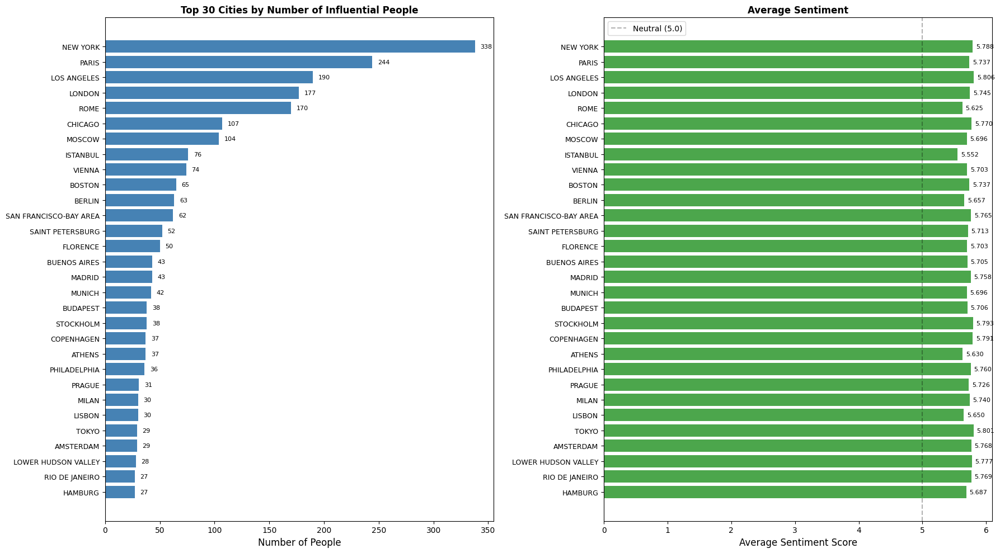

In [ ]:
# # Visualize top 30 cities with both metrics
# top_30_cities = df_city_ranking.head(30)

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

# # Plot 1: Number of people
# ax1.barh(range(len(top_30_cities)), top_30_cities['Total People'], color='steelblue')
# ax1.set_yticks(range(len(top_30_cities)))
# ax1.set_yticklabels(top_30_cities['City'], fontsize=9)
# ax1.set_xlabel('Number of People', fontsize=12)
# ax1.set_title('Top 30 Cities by Number of Influential People', fontsize=12, fontweight='bold')
# ax1.invert_yaxis()

# # Add count labels
# for i, v in enumerate(top_30_cities['Total People']):
#     ax1.text(v + 5, i, str(int(v)), va='center', fontsize=8)

# # Plot 2: Average sentiment
# colors = ['green' if s > 5.0 else 'orange' if s > 4.5 else 'red' 
#           for s in top_30_cities['Average Sentiment']]
# ax2.barh(range(len(top_30_cities)), top_30_cities['Average Sentiment'], color=colors, alpha=0.7)
# ax2.set_yticks(range(len(top_30_cities)))
# ax2.set_yticklabels(top_30_cities['City'], fontsize=9)
# ax2.set_xlabel('Average Sentiment Score', fontsize=12)
# ax2.set_title('Average Sentiment', fontsize=12, fontweight='bold')
# ax2.axvline(x=5.0, color='black', linestyle='--', alpha=0.3, label='Neutral (5.0)')
# ax2.invert_yaxis()
# ax2.legend()

# # Add sentiment labels
# for i, v in enumerate(top_30_cities['Average Sentiment']):
#     ax2.text(v + 0.05, i, f'{v:.3f}', va='center', fontsize=8)

# plt.tight_layout()
# plt.show()

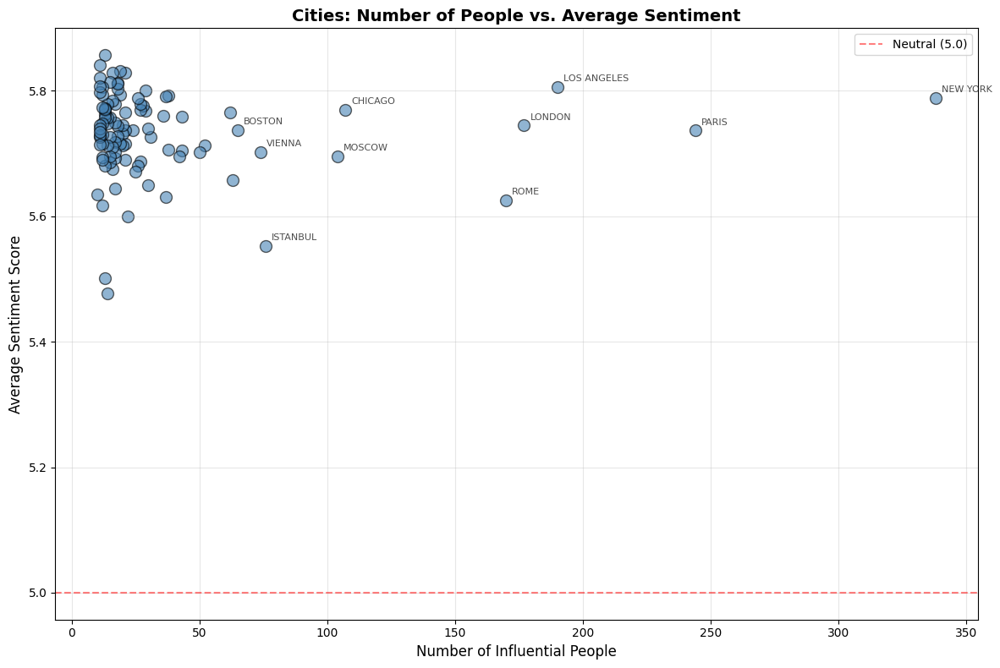


Correlation between number of people and sentiment:
                   Total People  Average Sentiment
Total People           1.000000          -0.002858
Average Sentiment     -0.002858           1.000000


In [ ]:
# # Scatter plot: Number of people vs Average sentiment
# plt.figure(figsize=(12, 8))

# # Filter out cities with no sentiment data
# df_filtered = df_city_ranking[df_city_ranking['Average Sentiment'] > 0]

# plt.scatter(df_filtered['Total People'], df_filtered['Average Sentiment'], 
#             s=100, alpha=0.6, c='steelblue', edgecolors='black')

# # Add horizontal line at neutral sentiment
# plt.axhline(y=5.0, color='red', linestyle='--', alpha=0.5, label='Neutral (5.0)')

# # Label top 10 cities
# top_10 = df_filtered.head(10)
# for idx, row in top_10.iterrows():
#     plt.annotate(row['City'], 
#                 (row['Total People'], row['Average Sentiment']),
#                 fontsize=8, alpha=0.7,
#                 xytext=(5, 5), textcoords='offset points')

# plt.xlabel('Number of Influential People', fontsize=12)
# plt.ylabel('Average Sentiment Score', fontsize=12)
# plt.title('Cities: Number of People vs. Average Sentiment', fontsize=14, fontweight='bold')
# plt.legend()
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()

# # Show correlation
# correlation = df_filtered[['Total People', 'Average Sentiment']].corr()
# print(f"\nCorrelation between number of people and sentiment:")
# print(correlation)

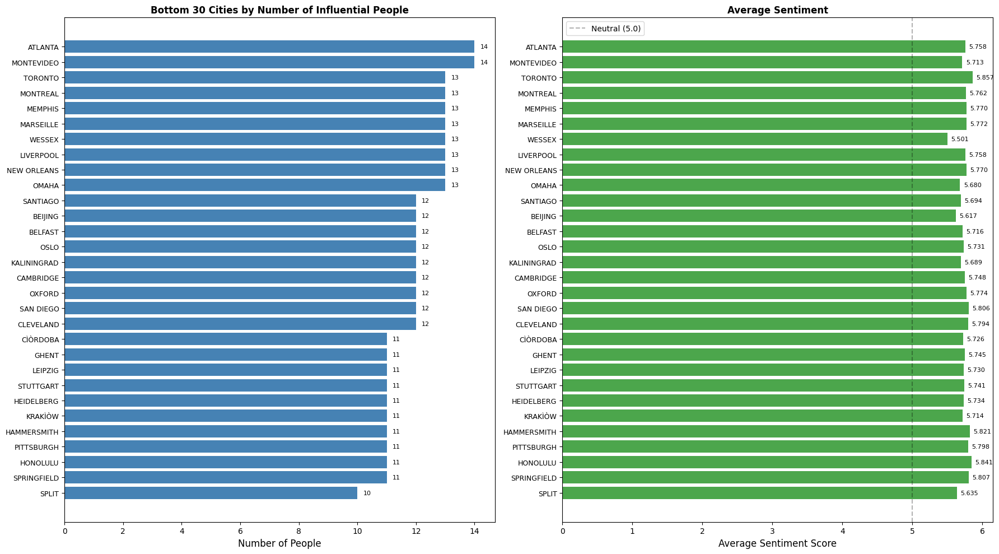

In [ ]:
# # Visualize bottom 30 cities with both metrics
# bottom_30_cities = df_city_ranking.tail(30)

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

# # Plot 1: Number of people
# ax1.barh(range(len(bottom_30_cities)), bottom_30_cities['Total People'], color='steelblue')
# ax1.set_yticks(range(len(bottom_30_cities)))
# ax1.set_yticklabels(bottom_30_cities['City'], fontsize=9)
# ax1.set_xlabel('Number of People', fontsize=12)
# ax1.set_title('Bottom 30 Cities by Number of Influential People', fontsize=12, fontweight='bold')
# ax1.invert_yaxis()

# # Add count labels
# for i, v in enumerate(bottom_30_cities['Total People']):
#     ax1.text(v + 0.2, i, str(int(v)), va='center', fontsize=8)

# # Plot 2: Average sentiment
# colors = ['green' if s > 5.0 else 'orange' if s > 4.5 else 'red' 
#           for s in bottom_30_cities['Average Sentiment']]
# ax2.barh(range(len(bottom_30_cities)), bottom_30_cities['Average Sentiment'], color=colors, alpha=0.7)
# ax2.set_yticks(range(len(bottom_30_cities)))
# ax2.set_yticklabels(bottom_30_cities['City'], fontsize=9)
# ax2.set_xlabel('Average Sentiment Score', fontsize=12)
# ax2.set_title('Average Sentiment', fontsize=12, fontweight='bold')
# ax2.axvline(x=5.0, color='black', linestyle='--', alpha=0.3, label='Neutral (5.0)')
# ax2.invert_yaxis()
# ax2.legend()

# # Add sentiment labels
# for i, v in enumerate(bottom_30_cities['Average Sentiment']):
#     ax2.text(v + 0.05, i, f'{v:.3f}', va='center', fontsize=8)

# plt.tight_layout()
# plt.show()

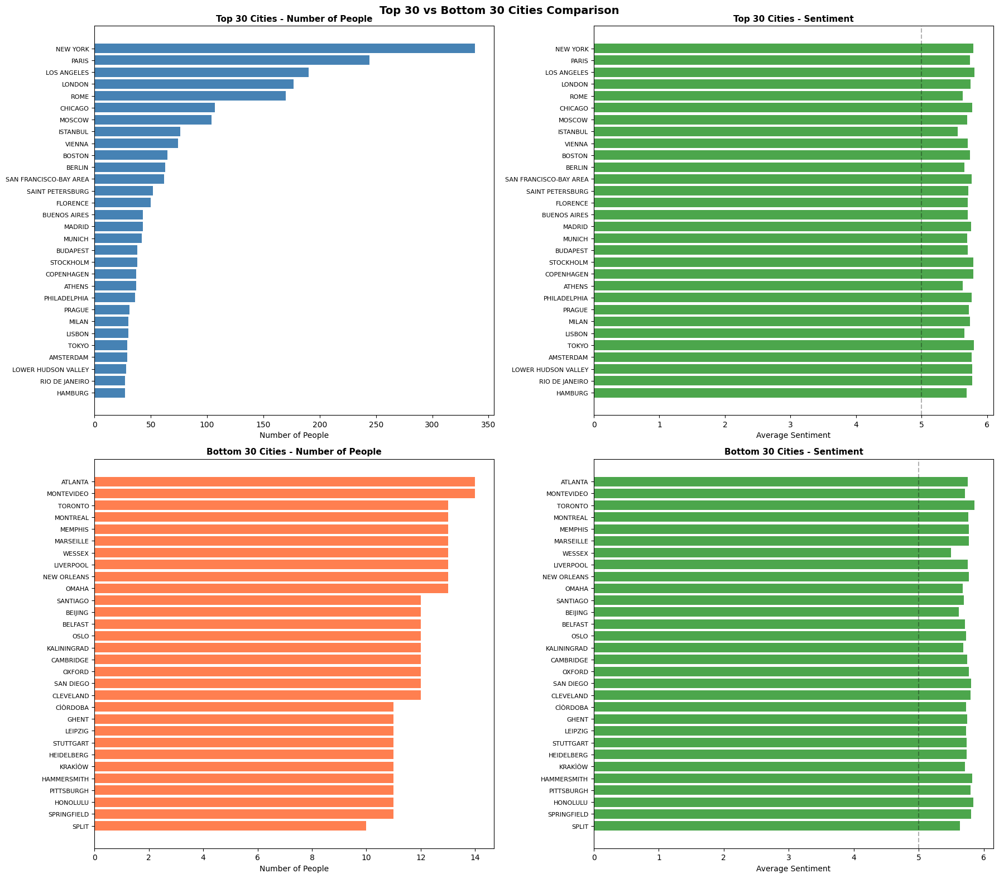


Comparison Statistics:
Top 30 cities:
  Avg sentiment: 5.7251
  Avg people: 77.23

Bottom 30 cities:
  Avg sentiment: 5.7401
  Avg people: 12.00


In [ ]:
# # Compare top 30 vs bottom 30
# fig, axes = plt.subplots(2, 2, figsize=(18, 16))

# top_30 = df_city_ranking.head(30)
# bottom_30 = df_city_ranking.tail(30)

# # Top 30 - Number of people
# axes[0, 0].barh(range(len(top_30)), top_30['Total People'], color='steelblue')
# axes[0, 0].set_yticks(range(len(top_30)))
# axes[0, 0].set_yticklabels(top_30['City'], fontsize=8)
# axes[0, 0].set_xlabel('Number of People', fontsize=10)
# axes[0, 0].set_title('Top 30 Cities - Number of People', fontsize=11, fontweight='bold')
# axes[0, 0].invert_yaxis()

# # Top 30 - Sentiment
# colors_top = ['green' if s > 5.0 else 'orange' if s > 4.5 else 'red' 
#               for s in top_30['Average Sentiment']]
# axes[0, 1].barh(range(len(top_30)), top_30['Average Sentiment'], color=colors_top, alpha=0.7)
# axes[0, 1].set_yticks(range(len(top_30)))
# axes[0, 1].set_yticklabels(top_30['City'], fontsize=8)
# axes[0, 1].set_xlabel('Average Sentiment', fontsize=10)
# axes[0, 1].set_title('Top 30 Cities - Sentiment', fontsize=11, fontweight='bold')
# axes[0, 1].axvline(x=5.0, color='black', linestyle='--', alpha=0.3)
# axes[0, 1].invert_yaxis()

# # Bottom 30 - Number of people
# axes[1, 0].barh(range(len(bottom_30)), bottom_30['Total People'], color='coral')
# axes[1, 0].set_yticks(range(len(bottom_30)))
# axes[1, 0].set_yticklabels(bottom_30['City'], fontsize=8)
# axes[1, 0].set_xlabel('Number of People', fontsize=10)
# axes[1, 0].set_title('Bottom 30 Cities - Number of People', fontsize=11, fontweight='bold')
# axes[1, 0].invert_yaxis()

# # Bottom 30 - Sentiment
# colors_bottom = ['green' if s > 5.0 else 'orange' if s > 4.5 else 'red' 
#                  for s in bottom_30['Average Sentiment']]
# axes[1, 1].barh(range(len(bottom_30)), bottom_30['Average Sentiment'], color=colors_bottom, alpha=0.7)
# axes[1, 1].set_yticks(range(len(bottom_30)))
# axes[1, 1].set_yticklabels(bottom_30['City'], fontsize=8)
# axes[1, 1].set_xlabel('Average Sentiment', fontsize=10)
# axes[1, 1].set_title('Bottom 30 Cities - Sentiment', fontsize=11, fontweight='bold')
# axes[1, 1].axvline(x=5.0, color='black', linestyle='--', alpha=0.3)
# axes[1, 1].invert_yaxis()

# plt.suptitle('Top 30 vs Bottom 30 Cities Comparison', fontsize=14, fontweight='bold')
# plt.tight_layout()
# plt.show()

# # Print statistics
# print("\nComparison Statistics:")
# print(f"Top 30 cities:")
# print(f"  Avg sentiment: {top_30['Average Sentiment'].mean():.4f}")
# print(f"  Avg people: {top_30['Total People'].mean():.2f}")
# print(f"\nBottom 30 cities:")
# print(f"  Avg sentiment: {bottom_30['Average Sentiment'].mean():.4f}")
# print(f"  Avg people: {bottom_30['Total People'].mean():.2f}")

More people - more chances of less 'happy' celebrities but I don't think that's unexpected.

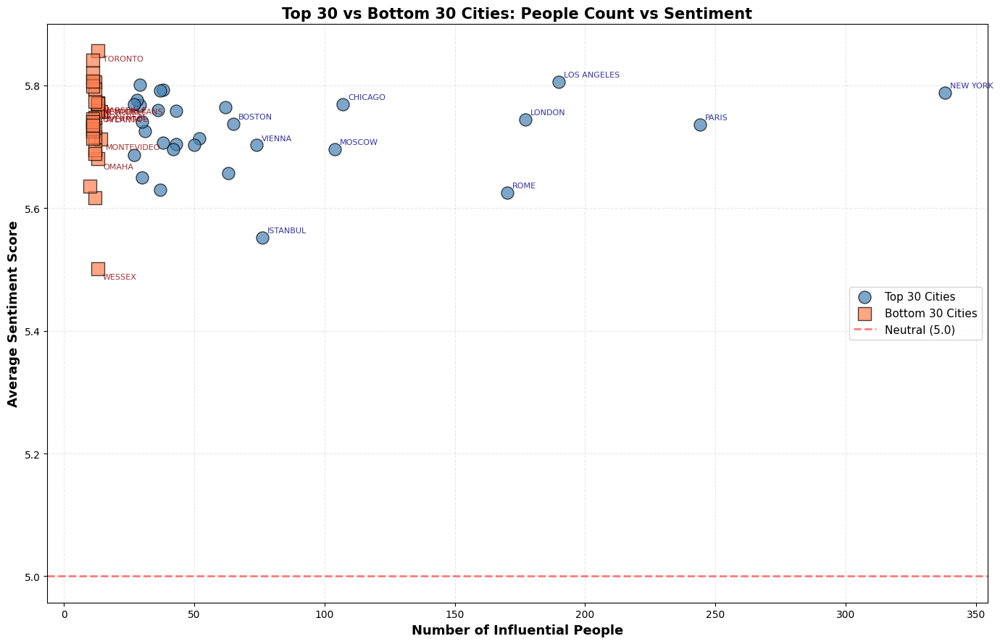


Comparison Statistics:
Metric                         Top 30          Bottom 30      
------------------------------------------------------------
Avg Sentiment                  5.7251          5.7401         
Avg People Count               77.23           12.00          
Max People Count               338             14             
Min People Count               27              10             
Sentiment Std Dev              0.0595          0.0705         


In [ ]:
# # Scatter plot: Comparison of Top 30 vs Bottom 30 cities
# plt.figure(figsize=(14, 9))

# # Get top 30 and bottom 30
# top_30 = df_city_ranking.head(30)
# bottom_30 = df_city_ranking.tail(30)

# # Plot top 30 cities
# plt.scatter(top_30['Total People'], top_30['Average Sentiment'], 
#             s=150, alpha=0.7, c='steelblue', edgecolors='black', 
#             label='Top 30 Cities', marker='o')

# # Plot bottom 30 cities
# plt.scatter(bottom_30['Total People'], bottom_30['Average Sentiment'], 
#             s=150, alpha=0.7, c='coral', edgecolors='black', 
#             label='Bottom 30 Cities', marker='s')

# # Add horizontal line at neutral sentiment
# plt.axhline(y=5.0, color='red', linestyle='--', alpha=0.5, linewidth=2, label='Neutral (5.0)')

# # Label top 10 cities
# for idx, row in top_30.head(10).iterrows():
#     plt.annotate(row['City'], 
#                 (row['Total People'], row['Average Sentiment']),
#                 fontsize=8, alpha=0.8, color='darkblue',
#                 xytext=(5, 5), textcoords='offset points')

# # Label bottom 10 cities
# for idx, row in bottom_30.head(10).iterrows():
#     plt.annotate(row['City'], 
#                 (row['Total People'], row['Average Sentiment']),
#                 fontsize=8, alpha=0.8, color='darkred',
#                 xytext=(5, -10), textcoords='offset points')

# plt.xlabel('Number of Influential People', fontsize=13, fontweight='bold')
# plt.ylabel('Average Sentiment Score', fontsize=13, fontweight='bold')
# plt.title('Top 30 vs Bottom 30 Cities: People Count vs Sentiment', 
#           fontsize=15, fontweight='bold')
# plt.legend(loc='best', fontsize=11)
# plt.grid(True, alpha=0.3, linestyle='--')
# plt.tight_layout()
# plt.show()

# # Print comparison statistics
# print("\nComparison Statistics:")
# print("=" * 60)
# print(f"{'Metric':<30} {'Top 30':<15} {'Bottom 30':<15}")
# print("-" * 60)
# print(f"{'Avg Sentiment':<30} {top_30['Average Sentiment'].mean():<15.4f} {bottom_30['Average Sentiment'].mean():<15.4f}")
# print(f"{'Avg People Count':<30} {top_30['Total People'].mean():<15.2f} {bottom_30['Total People'].mean():<15.2f}")
# print(f"{'Max People Count':<30} {top_30['Total People'].max():<15} {bottom_30['Total People'].max():<15}")
# print(f"{'Min People Count':<30} {top_30['Total People'].min():<15} {bottom_30['Total People'].min():<15}")
# print(f"{'Sentiment Std Dev':<30} {top_30['Average Sentiment'].std():<15.4f} {bottom_30['Average Sentiment'].std():<15.4f}")

In [ ]:
# # Get top 5 cities by sentiment
# top_5_happiest = sorted_cities_by_sentiment[:5]

# print("People from the Top 5 Happiest Cities")
# print("=" * 80)

# for rank, (city, data) in enumerate(top_5_happiest, 1):
#     print(f"\n{rank}. {city}")
#     print(f"   Average Sentiment: {data['avg_sentiment']:.4f}")
#     print(f"   Total People: {data['total_people']}")
#     print(f"   People with Sentiment: {data['people_with_sentiment']}")
#     print("-" * 80)
    
#     # Get the list of people from this city
#     city_people = None
#     for c, people in top_cities:
#         if c == city:
#             city_people = people
#             break
    
#     if city_people:
#         # Show all people with their sentiment scores
#         people_with_scores = []
#         for person in city_people:
#             sentiment = node_sentiments.get(person, 0)
#             if sentiment > 0:
#                 name = network.nodes[person].get('Name', person)
#                 occupation = network.nodes[person].get('occupation', 'N/A')
#                 people_with_scores.append((name, sentiment, person, occupation))
        
#         # Sort by sentiment
#         people_with_scores.sort(key=lambda x: x[1], reverse=True)
        
#         # Display all people
#         for i, (name, sentiment, node_id, occupation) in enumerate(people_with_scores, 1):
#             birth_year = network.nodes[node_id].get('birthyear', 'N/A')
#             print(f"   {i:3d}. {name:<30s} | {occupation:<25s} | Sentiment: {sentiment:.4f} (born {birth_year})")
        
#         if len(city_people) > len(people_with_scores):
#             print(f"\n   ({len(city_people) - len(people_with_scores)} people without sentiment data)")

People from the Top 5 Happiest Cities

1. TORONTO
   Average Sentiment: 5.8570
   Total People: 13
   People with Sentiment: 12
--------------------------------------------------------------------------------
     1. Howard Shore                   | COMPOSER                  | Sentiment: 6.1024 (born 1946.0)
     2. Frank Gehry                    | ARCHITECT                 | Sentiment: 5.9810 (born 1929.0)
     3. Christopher Plummer            | ACTOR                     | Sentiment: 5.9750 (born 1929.0)
     4. Tara Strong                    | ACTOR                     | Sentiment: 5.9386 (born 1973.0)
     5. Chris Diamantopoulos           | ACTOR                     | Sentiment: 5.9013 (born 1975.0)
     6. Neil Young                     | MUSICIAN                  | Sentiment: 5.8847 (born 1945.0)
     7. Mary Pickford                  | ACTOR                     | Sentiment: 5.8775 (born 1892.0)
     8. Cory Doctorow                  | WRITER                    | Sentiment: 5.85

Maybe interesting that most are actors and if they are politicians, they are mostly liked such as Gandhi or Barack Obama.

Analysing top 3 cities by influential people. I created a wordcloud for each era for each of the 3 cities with the most influential people. The wordcloud is based on the wikipedia content of the influential people from that city.

Top 3 cities for wordcloud analysis:
1. NEW YORK: 338 people
2. PARIS: 244 people
3. LOS ANGELES: 190 people

Processing City 1: NEW YORK

  Era: Post-War (1945-2025) (157 people)
  Fetched content for 156/157 people (1 errors)

  Era: Wartime (1840-1945) (177 people)
  Fetched content for 176/177 people (1 errors)

  Era: Industrial Era (1760-1840) (3 people)
  Fetched content for 3/3 people (0 errors)

  Era: Early Modern (1450-1760) (1 people)
  Fetched content for 1/1 people (0 errors)


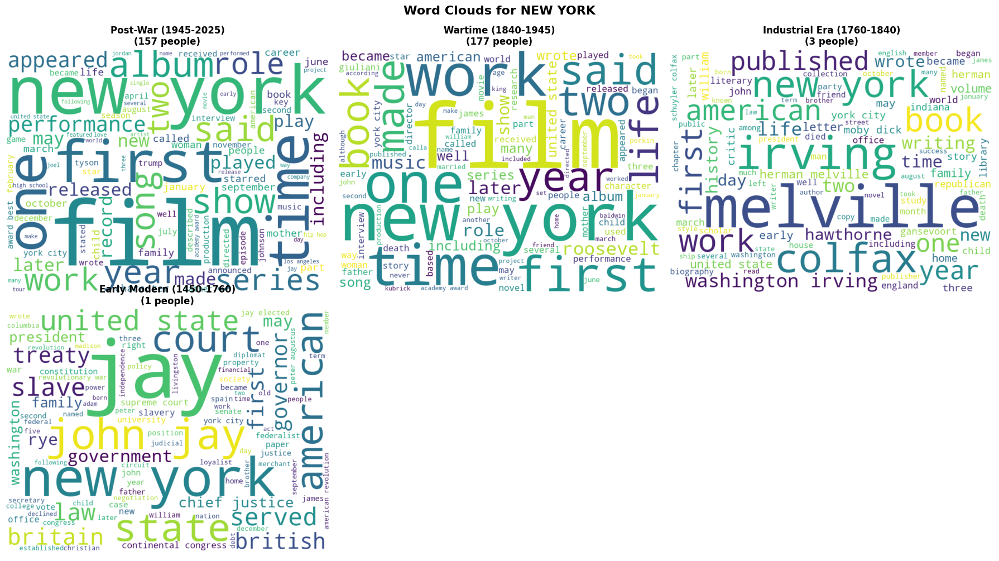


Processing City 2: PARIS

  Era: Wartime (1840-1945) (97 people)
  Fetched content for 72/97 people (25 errors)

  Era: Middle Ages (476-1450) (15 people)
  Fetched content for 13/15 people (2 errors)

  Era: Early Modern (1450-1760) (49 people)
  Fetched content for 34/49 people (15 errors)

  Era: Industrial Era (1760-1840) (50 people)
  Fetched content for 37/50 people (13 errors)

  Era: Post-War (1945-2025) (33 people)
  Fetched content for 28/33 people (5 errors)


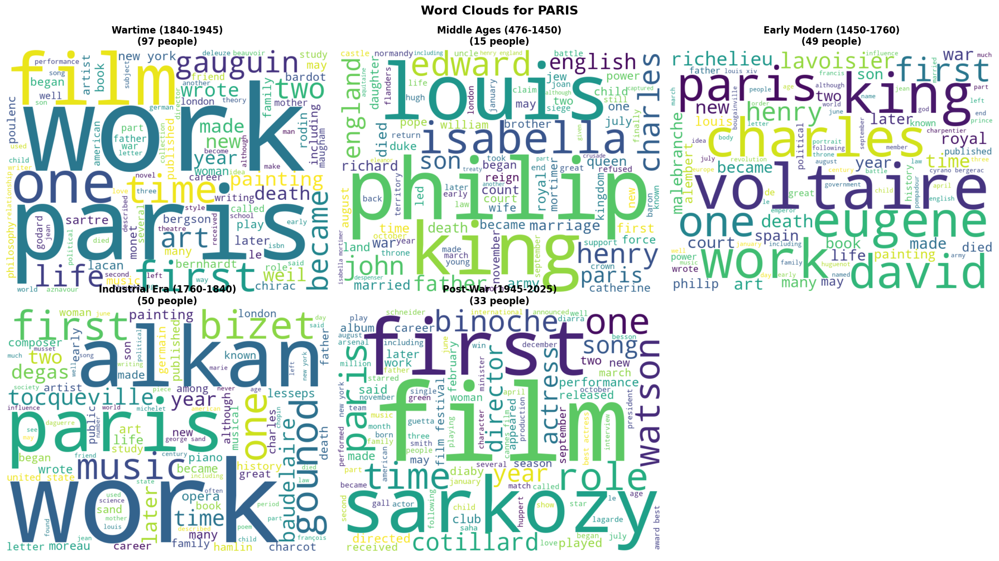


Processing City 3: LOS ANGELES

  Era: Post-War (1945-2025) (157 people)
  Fetched content for 156/157 people (1 errors)

  Era: Wartime (1840-1945) (33 people)
  Fetched content for 33/33 people (0 errors)


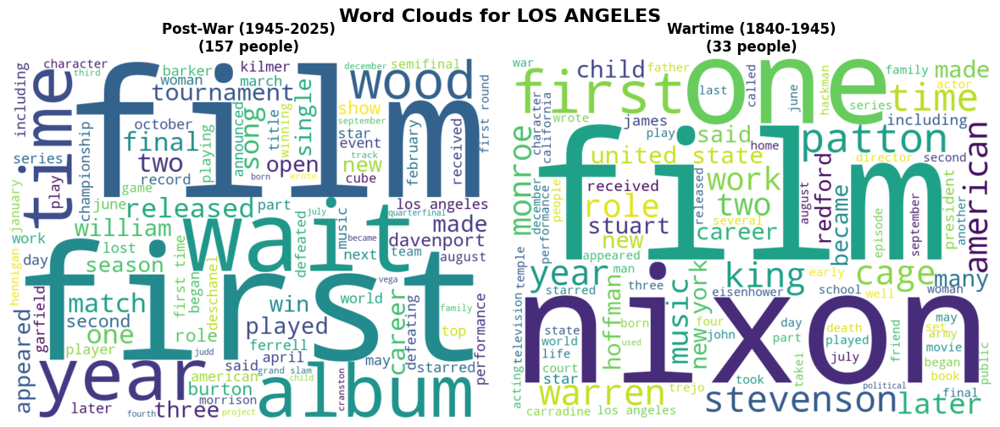


✓ Wordcloud generation complete!


In [ ]:
# # Get top 3 cities by number of people
# top_3_cities = top_cities[:3]

# print("Top 3 cities for wordcloud analysis:")
# for i, (city, people) in enumerate(top_3_cities, 1):
#     print(f"{i}. {city}: {len(people)} people")

# def get_combined_content(people_list, network):
#     """
#     Fetch Wikipedia content for a list of people and combine it.
#     Uses Wikipedia API for clean plain text.
    
#     Args:
#         people_list: List of node IDs
#         network: NetworkX graph
        
#     Returns:
#         str: Combined Wikipedia content (plain text)
#     """
#     combined_content = []
#     errors = 0
    
#     for person in people_list:
#         try:
#             wiki_link = network.nodes[person].get('Link', '')
#             if wiki_link:
#                 # Extract page title from URL
#                 page_title = wiki_link.split('/wiki/')[-1]
                
#                 # Use Wikipedia API to get clean plain text content
#                 api_url = f"https://en.wikipedia.org/w/api.php?action=query&format=json&titles={page_title}&prop=extracts&explaintext=true"
                
#                 req = urllib.request.Request(api_url, headers={'User-Agent': "Magic Browser"}) 
#                 con = urllib.request.urlopen(req)
#                 response = con.read().decode('utf-8')
#                 data = json.loads(response)
                
#                 # Extract the text content
#                 pages = data['query']['pages']
#                 for page_id in pages:
#                     if 'extract' in pages[page_id]:
#                         content = pages[page_id]['extract']
#                         combined_content.append(content)
#                         break
                        
#         except Exception as e:
#             errors += 1
#             continue
    
#     print(f"  Fetched content for {len(combined_content)}/{len(people_list)} people ({errors} errors)")
#     return ' '.join(combined_content)

# # Generate wordclouds for each city and era
# for city_idx, (city, all_people) in enumerate(top_3_cities, 1):
#     print(f"\n{'='*80}")
#     print(f"Processing City {city_idx}: {city}")
#     print(f"{'='*80}")
    
#     era_dict = city_era_groups[city]
    
#     # Get eras that have people
#     eras_with_people = [(era, people) for era, people in era_dict.items() 
#                         if len(people) > 0 and era != 'Unknown']
    
#     if len(eras_with_people) == 0:
#         print(f"No eras with people for {city}")
#         continue
    
#     # Create subplots for all eras of this city
#     n_eras = len(eras_with_people)
#     n_cols = min(3, n_eras)
#     n_rows = (n_eras + n_cols - 1) // n_cols
    
#     fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
#     if n_eras == 1:
#         axes = np.array([axes])
#     axes = axes.flatten()
    
#     for idx, (era, era_people) in enumerate(eras_with_people):
#         print(f"\n  Era: {era} ({len(era_people)} people)")
        
#         # Get combined Wikipedia content for all people in this era
#         combined_content = get_combined_content(era_people, network)
        
#         if combined_content:
#             # Clean and tokenize the content
#             tokens = clean_tokenize_lemmatize_nltk(combined_content)

#             tokens = [token for token in tokens if token not in {'new york', 'french', 'france', 'america'}]
            
#             # Create text from tokens
#             text = ' '.join(tokens)
            
#             if len(text) > 0:
#                 # Generate wordcloud
#                 wordcloud = WordCloud(width=800, height=600, 
#                                     background_color='white',
#                                     colormap='viridis',
#                                     max_words=100).generate(text)
                
#                 # Plot
#                 ax = axes[idx]
#                 ax.imshow(wordcloud, interpolation='bilinear')
#                 ax.set_title(f'{era}\n({len(era_people)} people)', 
#                            fontsize=12, fontweight='bold')
#                 ax.axis('off')
#             else:
#                 axes[idx].text(0.5, 0.5, 'No text data', 
#                              ha='center', va='center', fontsize=14)
#                 axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                   fontsize=12, fontweight='bold')
#                 axes[idx].axis('off')
#         else:
#             axes[idx].text(0.5, 0.5, 'No Wikipedia content', 
#                          ha='center', va='center', fontsize=14)
#             axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                               fontsize=12, fontweight='bold')
#             axes[idx].axis('off')
    
#     # Hide unused subplots
#     for idx in range(len(eras_with_people), len(axes)):
#         axes[idx].axis('off')
    
#     plt.suptitle(f'Word Clouds for {city}', fontsize=16, fontweight='bold', y=1.00)
#     plt.tight_layout()
#     plt.show()

# print("\n✓ Wordcloud generation complete!")

Some nice things here: like los angeles having 'film', wartime and industrial era having 'work'. new york early modern having slave..

Processing City: ATHENS

  Era: Before Christ (< 30) (20 people)
  Fetched content for 20/20 people (0 errors)

  Era: Wartime (1840-1945) (7 people)
  Fetched content for 7/7 people (0 errors)

  Era: Post-War (1945-2025) (6 people)
  Fetched content for 6/6 people (0 errors)

  Era: Classical Era (30-476) (3 people)
  Fetched content for 3/3 people (0 errors)

  Era: Middle Ages (476-1450) (1 people)
  Fetched content for 1/1 people (0 errors)


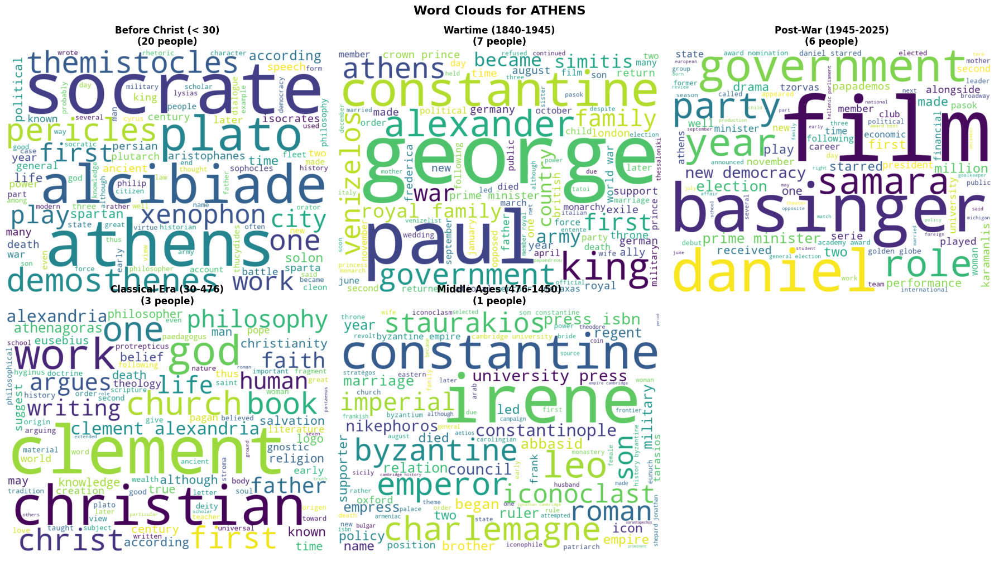


✓ Wordcloud generation complete!


In [ ]:
# # Generate wordcloud only for Athens
# athens_data = None
# for city, people in top_cities:
#     if city == "ATHENS":
#         athens_data = (city, people)
#         break

# if athens_data:
#     city, all_people = athens_data
#     print(f"Processing City: {city}")
#     print(f"{'='*80}")
    
#     era_dict = city_era_groups[city]
    
#     # Get eras that have people
#     eras_with_people = [(era, people) for era, people in era_dict.items() 
#                         if len(people) > 0 and era != 'Unknown']
    
#     if len(eras_with_people) == 0:
#         print(f"No eras with people for {city}")
#     else:
#         # Create subplots for all eras of Athens
#         n_eras = len(eras_with_people)
#         n_cols = min(3, n_eras)
#         n_rows = (n_eras + n_cols - 1) // n_cols
        
#         fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
#         if n_eras == 1:
#             axes = np.array([axes])
#         axes = axes.flatten()
        
#         for idx, (era, era_people) in enumerate(eras_with_people):
#             print(f"\n  Era: {era} ({len(era_people)} people)")
            
#             # Get combined Wikipedia content for all people in this era
#             combined_content = get_combined_content(era_people, network)
            
#             if combined_content:
#                 # Clean and tokenize the content
#                 tokens = clean_tokenize_lemmatize_nltk(combined_content)
#                 tokens = [token for token in tokens if token not in {'greek', 'greece', 'athen', 'athenian'}]
                
#                 # Create text from tokens
#                 text = ' '.join(tokens)
                
#                 if len(text) > 0:
#                     # Generate wordcloud
#                     wordcloud = WordCloud(width=800, height=600, 
#                                         background_color='white',
#                                         colormap='viridis',
#                                         max_words=100).generate(text)
                    
#                     # Plot
#                     ax = axes[idx]
#                     ax.imshow(wordcloud, interpolation='bilinear')
#                     ax.set_title(f'{era}\n({len(era_people)} people)', 
#                                fontsize=12, fontweight='bold')
#                     ax.axis('off')
#                 else:
#                     axes[idx].text(0.5, 0.5, 'No text data', 
#                                  ha='center', va='center', fontsize=14)
#                     axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                       fontsize=12, fontweight='bold')
#                     axes[idx].axis('off')
#             else:
#                 axes[idx].text(0.5, 0.5, 'No Wikipedia content', 
#                              ha='center', va='center', fontsize=14)
#                 axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                   fontsize=12, fontweight='bold')
#                 axes[idx].axis('off')
        
#         # Hide unused subplots
#         for idx in range(len(eras_with_people), len(axes)):
#             axes[idx].axis('off')
        
#         plt.suptitle(f'Word Clouds for {city}', fontsize=16, fontweight='bold', y=1.00)
#         plt.tight_layout()
#         plt.show()

# print("\n✓ Wordcloud generation complete!")

Athens has data for all eras so we could see the wordclouds change.

Then I tried London with the full network.

Processing City: LONDON (using full network)

  Era: Post-War (1945-2025) (61 people)
  Fetched content for 61/61 people (0 errors)

  Era: Early Modern (1450-1760) (40 people)
  Fetched content for 40/40 people (0 errors)

  Era: Wartime (1840-1945) (50 people)
  Fetched content for 50/50 people (0 errors)

  Era: Middle Ages (476-1450) (4 people)
  Fetched content for 4/4 people (0 errors)

  Era: Industrial Era (1760-1840) (21 people)
  Fetched content for 21/21 people (0 errors)

  Era: Before Christ (< 30) (1 people)
  Fetched content for 1/1 people (0 errors)


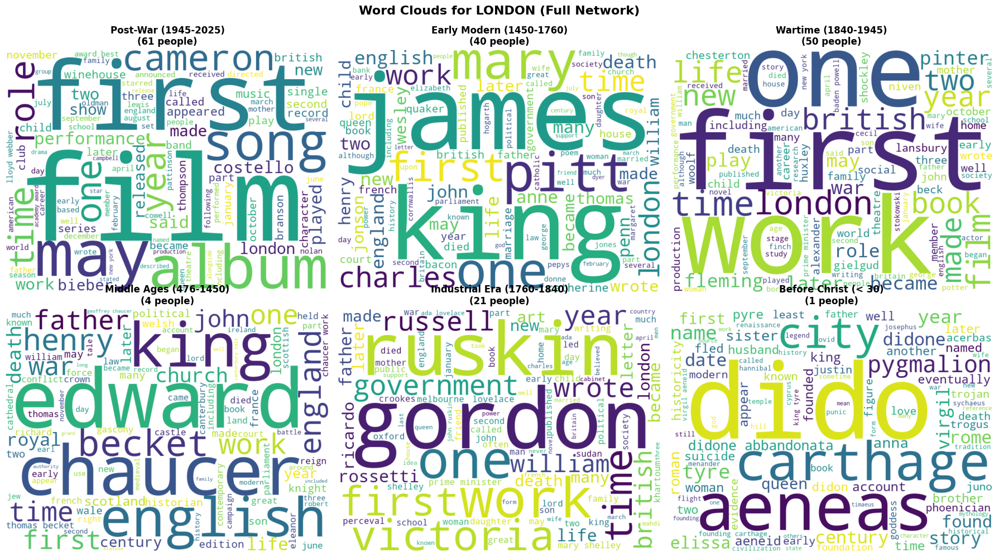


✓ Wordcloud generation complete!


In [ ]:
# # Generate wordcloud for Athens using the full network
# athens_data = None
# for city, people in full_top_cities:
#     if city == "LONDON":
#         athens_data = (city, people)
#         break

# if athens_data:
#     city, all_people = athens_data
#     print(f"Processing City: {city} (using full network)")
#     print(f"{'='*80}")
    
#     era_dict = full_city_era_groups[city]
    
#     # Get eras that have people
#     eras_with_people = [(era, people) for era, people in era_dict.items() 
#                         if len(people) > 0 and era != 'Unknown']
    
#     if len(eras_with_people) == 0:
#         print(f"No eras with people for {city}")
#     else:
#         # Create subplots for all eras of Athens
#         n_eras = len(eras_with_people)
#         n_cols = min(3, n_eras)
#         n_rows = (n_eras + n_cols - 1) // n_cols
        
#         fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
#         if n_eras == 1:
#             axes = np.array([axes])
#         axes = axes.flatten()
        
#         for idx, (era, era_people) in enumerate(eras_with_people):
#             print(f"\n  Era: {era} ({len(era_people)} people)")
            
#             # Get combined Wikipedia content for all people in this era
#             combined_content = get_combined_content(era_people, full_network)
            
#             if combined_content:
#                 # Clean and tokenize the content
#                 tokens = clean_tokenize_lemmatize_nltk(combined_content)
#                 tokens = [token for token in tokens if token not in {'greek', 'greece', 'athen', 'athenian'}]
                
#                 # Create text from tokens
#                 text = ' '.join(tokens)
                
#                 if len(text) > 0:
#                     # Generate wordcloud
#                     wordcloud = WordCloud(width=800, height=600, 
#                                         background_color='white',
#                                         colormap='viridis',
#                                         max_words=100).generate(text)
                    
#                     # Plot
#                     ax = axes[idx]
#                     ax.imshow(wordcloud, interpolation='bilinear')
#                     ax.set_title(f'{era}\n({len(era_people)} people)', 
#                                fontsize=12, fontweight='bold')
#                     ax.axis('off')
#                 else:
#                     axes[idx].text(0.5, 0.5, 'No text data', 
#                                  ha='center', va='center', fontsize=14)
#                     axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                       fontsize=12, fontweight='bold')
#                     axes[idx].axis('off')
#             else:
#                 axes[idx].text(0.5, 0.5, 'No Wikipedia content', 
#                              ha='center', va='center', fontsize=14)
#                 axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                   fontsize=12, fontweight='bold')
#                 axes[idx].axis('off')
        
#         # Hide unused subplots
#         for idx in range(len(eras_with_people), len(axes)):
#             axes[idx].axis('off')
        
#         plt.suptitle(f'Word Clouds for {city} (Full Network)', fontsize=16, fontweight='bold', y=1.00)
#         plt.tight_layout()
#         plt.show()

# print("\n✓ Wordcloud generation complete!")

Tried Rome too

Processing City: ROME (using full network)

  Era: Before Christ (< 30) (20 people)
  Fetched content for 20/20 people (0 errors)

  Era: Early Modern (1450-1760) (13 people)
  Fetched content for 13/13 people (0 errors)

  Era: Wartime (1840-1945) (16 people)
  Fetched content for 16/16 people (0 errors)

  Era: Post-War (1945-2025) (22 people)
  Fetched content for 22/22 people (0 errors)

  Era: Classical Era (30-476) (32 people)
  Fetched content for 32/32 people (0 errors)

  Era: Middle Ages (476-1450) (67 people)
  Fetched content for 67/67 people (0 errors)


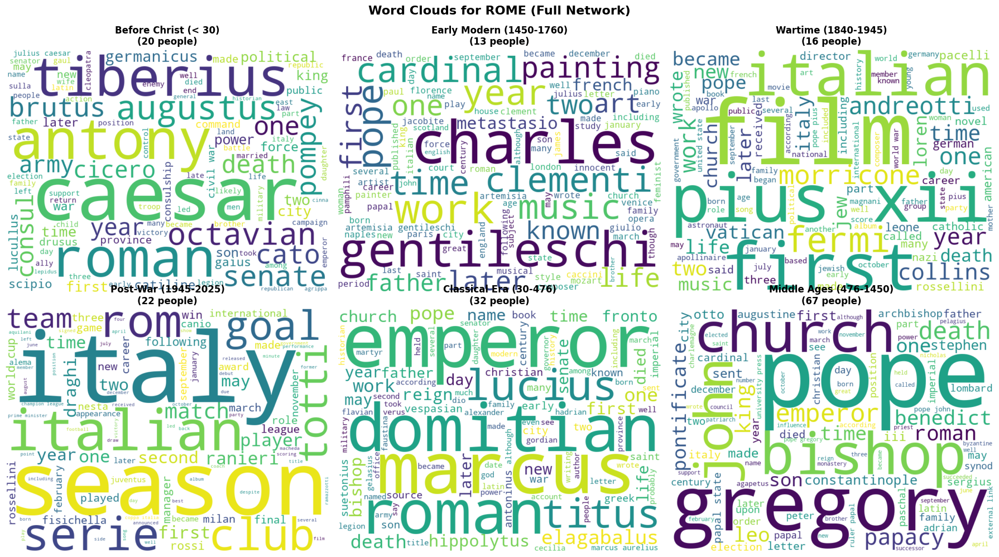


✓ Wordcloud generation complete!


In [ ]:
# # Generate wordcloud for Athens using the full network
# athens_data = None
# for city, people in full_top_cities:
#     if city == "ROME":
#         athens_data = (city, people)
#         break

# if athens_data:
#     city, all_people = athens_data
#     print(f"Processing City: {city} (using full network)")
#     print(f"{'='*80}")
    
#     era_dict = full_city_era_groups[city]
    
#     # Get eras that have people
#     eras_with_people = [(era, people) for era, people in era_dict.items() 
#                         if len(people) > 0 and era != 'Unknown']
    
#     if len(eras_with_people) == 0:
#         print(f"No eras with people for {city}")
#     else:
#         # Create subplots for all eras of Athens
#         n_eras = len(eras_with_people)
#         n_cols = min(3, n_eras)
#         n_rows = (n_eras + n_cols - 1) // n_cols
        
#         fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
#         if n_eras == 1:
#             axes = np.array([axes])
#         axes = axes.flatten()
        
#         for idx, (era, era_people) in enumerate(eras_with_people):
#             print(f"\n  Era: {era} ({len(era_people)} people)")
            
#             # Get combined Wikipedia content for all people in this era
#             combined_content = get_combined_content(era_people, full_network)
            
#             if combined_content:
#                 # Clean and tokenize the content
#                 tokens = clean_tokenize_lemmatize_nltk(combined_content)
#                 tokens = [token for token in tokens if token not in {'rome'}]
                
#                 # Create text from tokens
#                 text = ' '.join(tokens)
                
#                 if len(text) > 0:
#                     # Generate wordcloud
#                     wordcloud = WordCloud(width=800, height=600, 
#                                         background_color='white',
#                                         colormap='viridis',
#                                         max_words=100).generate(text)
                    
#                     # Plot
#                     ax = axes[idx]
#                     ax.imshow(wordcloud, interpolation='bilinear')
#                     ax.set_title(f'{era}\n({len(era_people)} people)', 
#                                fontsize=12, fontweight='bold')
#                     ax.axis('off')
#                 else:
#                     axes[idx].text(0.5, 0.5, 'No text data', 
#                                  ha='center', va='center', fontsize=14)
#                     axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                       fontsize=12, fontweight='bold')
#                     axes[idx].axis('off')
#             else:
#                 axes[idx].text(0.5, 0.5, 'No Wikipedia content', 
#                              ha='center', va='center', fontsize=14)
#                 axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                   fontsize=12, fontweight='bold')
#                 axes[idx].axis('off')
        
#         # Hide unused subplots
#         for idx in range(len(eras_with_people), len(axes)):
#             axes[idx].axis('off')
        
#         plt.suptitle(f'Word Clouds for {city} (Full Network)', fontsize=16, fontweight='bold', y=1.00)
#         plt.tight_layout()
#         plt.show()

# print("\n✓ Wordcloud generation complete!")

Analyzing word 'pope' frequency for ROME

Era: Before Christ (< 30) (20 people)
  Fetched content for 20/20 people (0 errors)
  'pope' appears 16 times out of 55011 tokens
  Frequency: 0.29 per 1000 words

Era: Classical Era (30-476) (32 people)
  Fetched content for 32/32 people (0 errors)
  'pope' appears 167 times out of 31026 tokens
  Frequency: 5.38 per 1000 words

Era: Middle Ages (476-1450) (67 people)
  Fetched content for 67/67 people (0 errors)
  'pope' appears 804 times out of 35933 tokens
  Frequency: 22.37 per 1000 words

Era: Early Modern (1450-1760) (13 people)
  Fetched content for 13/13 people (0 errors)
  'pope' appears 135 times out of 17890 tokens
  Frequency: 7.55 per 1000 words

Era: Wartime (1840-1945) (16 people)
  Fetched content for 16/16 people (0 errors)
  'pope' appears 181 times out of 40432 tokens
  Frequency: 4.48 per 1000 words

Era: Post-War (1945-2025) (22 people)
  Fetched content for 22/22 people (0 errors)
  'pope' appears 1 times out of 37504 toke

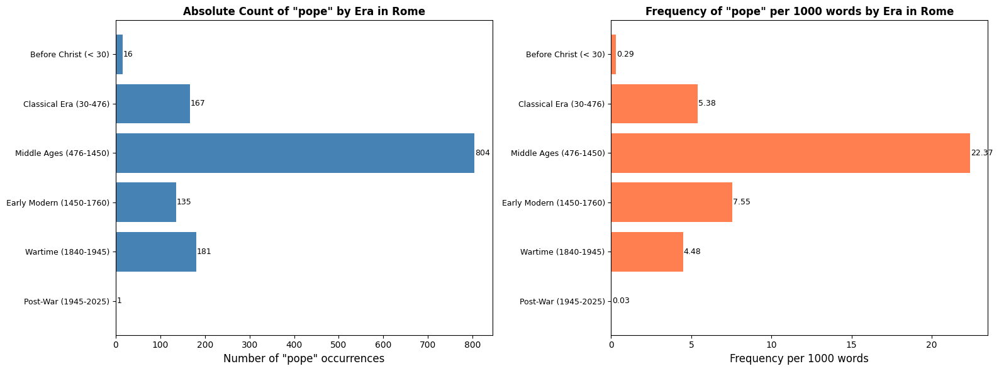


Summary Table:
Era                                 Count      Total Tokens    Per 1000  
--------------------------------------------------------------------------------
Before Christ (< 30)                16         55011           0.29      
Classical Era (30-476)              167        31026           5.38      
Middle Ages (476-1450)              804        35933           22.37     
Early Modern (1450-1760)            135        17890           7.55      
Wartime (1840-1945)                 181        40432           4.48      
Post-War (1945-2025)                1          37504           0.03      

✓ Analysis complete!


In [ ]:
# # Analyze frequency of the word 'pope' through eras for Rome
# rome_data = None
# for city, people in full_top_cities:
#     if city == "ROME":
#         rome_data = (city, people)
#         break

# if rome_data:
#     city, all_people = rome_data
#     print(f"Analyzing word 'pope' frequency for {city}")
#     print(f"{'='*80}")
    
#     era_dict = full_city_era_groups[city]
    
#     # Define chronological order
#     era_order_chrono = [
#         'Before Christ (< 30)',
#         'Classical Era (30-476)',
#         'Middle Ages (476-1450)',
#         'Early Modern (1450-1760)',
#         'Industrial Era (1760-1840)',
#         'Wartime (1840-1945)',
#         'Post-War (1945-2025)'
#     ]
    
#     # Get eras that have people in chronological order
#     eras_with_people = [(era, era_dict[era]) for era in era_order_chrono 
#                         if era in era_dict and len(era_dict[era]) > 0]
    
#     pope_frequencies = []
    
#     for era, era_people in eras_with_people:
#         print(f"\nEra: {era} ({len(era_people)} people)")
        
#         # Get combined Wikipedia content for all people in this era
#         combined_content = get_combined_content(era_people, full_network)
        
#         if combined_content:
#             # Clean and tokenize the content
#             tokens = clean_tokenize_lemmatize_nltk(combined_content)
            
#             # Count total tokens and 'pope' occurrences
#             total_tokens = len(tokens)
#             pope_count = tokens.count('pope')
            
#             if total_tokens > 0:
#                 pope_freq = (pope_count / total_tokens) * 1000  # per 1000 words
#                 pope_frequencies.append({
#                     'era': era,
#                     'pope_count': pope_count,
#                     'total_tokens': total_tokens,
#                     'frequency_per_1000': pope_freq
#                 })
#                 print(f"  'pope' appears {pope_count} times out of {total_tokens} tokens")
#                 print(f"  Frequency: {pope_freq:.2f} per 1000 words")
    
#     # Visualize the results
#     if pope_frequencies:
#         df_pope = pd.DataFrame(pope_frequencies)
        
#         fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
        
#         # Plot 1: Absolute count
#         ax1.barh(range(len(df_pope)), df_pope['pope_count'], color='steelblue')
#         ax1.set_yticks(range(len(df_pope)))
#         ax1.set_yticklabels(df_pope['era'], fontsize=9)
#         ax1.set_xlabel('Number of "pope" occurrences', fontsize=12)
#         ax1.set_title('Absolute Count of "pope" by Era in Rome', fontsize=12, fontweight='bold')
#         ax1.invert_yaxis()
        
#         # Add count labels
#         for i, v in enumerate(df_pope['pope_count']):
#             ax1.text(v + 1, i, str(int(v)), va='center', fontsize=9)
        
#         # Plot 2: Frequency per 1000 words
#         ax2.barh(range(len(df_pope)), df_pope['frequency_per_1000'], color='coral')
#         ax2.set_yticks(range(len(df_pope)))
#         ax2.set_yticklabels(df_pope['era'], fontsize=9)
#         ax2.set_xlabel('Frequency per 1000 words', fontsize=12)
#         ax2.set_title('Frequency of "pope" per 1000 words by Era in Rome', fontsize=12, fontweight='bold')
#         ax2.invert_yaxis()
        
#         # Add frequency labels
#         for i, v in enumerate(df_pope['frequency_per_1000']):
#             ax2.text(v + 0.05, i, f'{v:.2f}', va='center', fontsize=9)
        
#         plt.tight_layout()
#         plt.show()
        
#         # Print summary table
#         print("\n" + "="*80)
#         print("Summary Table:")
#         print("="*80)
#         print(f"{'Era':<35} {'Count':<10} {'Total Tokens':<15} {'Per 1000':<10}")
#         print("-"*80)
#         for _, row in df_pope.iterrows():
#             print(f"{row['era']:<35} {row['pope_count']:<10} {row['total_tokens']:<15} {row['frequency_per_1000']:<10.2f}")

# print("\n✓ Analysis complete!")

Processing City: ROME (using full network)

  Era: Before Christ (< 30) (20 people)
  Fetched content for 20/20 people (0 errors)

  Era: Classical Era (30-476) (32 people)
  Fetched content for 32/32 people (0 errors)

  Era: Middle Ages (476-1450) (67 people)
  Fetched content for 67/67 people (0 errors)

  Era: Early Modern (1450-1760) (13 people)
  Fetched content for 13/13 people (0 errors)

  Era: Wartime (1840-1945) (16 people)
  Fetched content for 16/16 people (0 errors)

  Era: Post-War (1945-2025) (22 people)
  Fetched content for 22/22 people (0 errors)


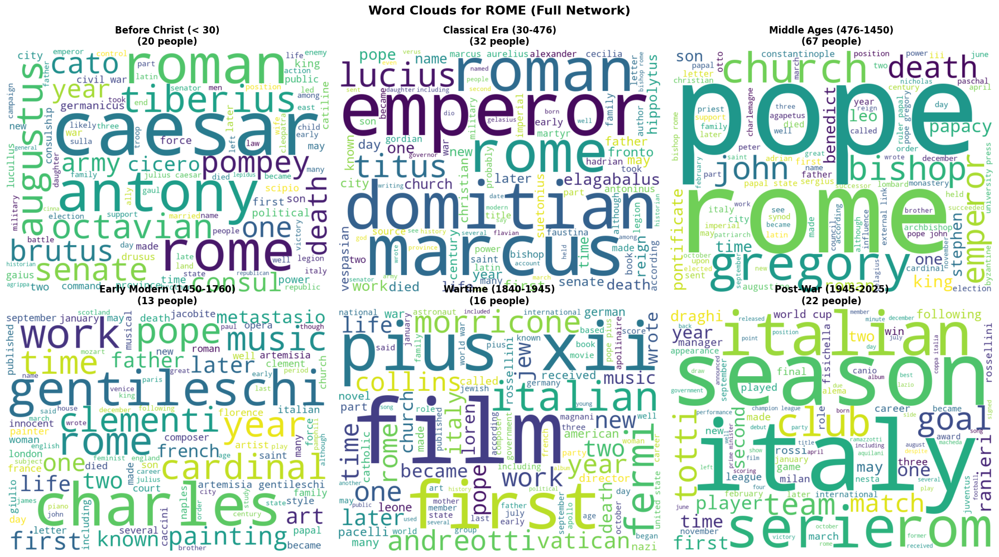


✓ Wordcloud generation complete!


In [ ]:
# # Generate wordcloud for Athens using the full network
# athens_data = None
# for city, people in full_top_cities:
#     if city == "ROME":
#         athens_data = (city, people)
#         break

# if athens_data:
#     city, all_people = athens_data
#     print(f"Processing City: {city} (using full network)")
#     print(f"{'='*80}")
    
#     era_dict = full_city_era_groups[city]
    
#     # Define chronological order
#     era_order_chrono = [
#         'Before Christ (< 30)',
#         'Classical Era (30-476)',
#         'Middle Ages (476-1450)',
#         'Early Modern (1450-1760)',
#         'Industrial Era (1760-1840)',
#         'Wartime (1840-1945)',
#         'Post-War (1945-2025)'
#     ]
    
#     # Get eras that have people in chronological order
#     eras_with_people = [(era, era_dict[era]) for era in era_order_chrono 
#                         if era in era_dict and len(era_dict[era]) > 0]
    
#     if len(eras_with_people) == 0:
#         print(f"No eras with people for {city}")
#     else:
#         # Create subplots for all eras of Athens
#         n_eras = len(eras_with_people)
#         n_cols = min(3, n_eras)
#         n_rows = (n_eras + n_cols - 1) // n_cols
        
#         fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
#         if n_eras == 1:
#             axes = np.array([axes])
#         axes = axes.flatten()
        
#         for idx, (era, era_people) in enumerate(eras_with_people):
#             print(f"\n  Era: {era} ({len(era_people)} people)")
            
#             # Get combined Wikipedia content for all people in this era
#             combined_content = get_combined_content(era_people, full_network)
            
#             if combined_content:
#                 # Clean and tokenize the content
#                 tokens = clean_tokenize_lemmatize_nltk(combined_content)
#                 tokens = [token for token in tokens if token not in {'greek', 'greece', 'athen', 'athenian'}]
                
#                 # Create text from tokens
#                 text = ' '.join(tokens)
                
#                 if len(text) > 0:
#                     # Generate wordcloud
#                     wordcloud = WordCloud(width=800, height=600, 
#                                         background_color='white',
#                                         colormap='viridis',
#                                         max_words=100).generate(text)
                    
#                     # Plot
#                     ax = axes[idx]
#                     ax.imshow(wordcloud, interpolation='bilinear')
#                     ax.set_title(f'{era}\n({len(era_people)} people)', 
#                                fontsize=12, fontweight='bold')
#                     ax.axis('off')
#                 else:
#                     axes[idx].text(0.5, 0.5, 'No text data', 
#                                  ha='center', va='center', fontsize=14)
#                     axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                       fontsize=12, fontweight='bold')
#                     axes[idx].axis('off')
#             else:
#                 axes[idx].text(0.5, 0.5, 'No Wikipedia content', 
#                              ha='center', va='center', fontsize=14)
#                 axes[idx].set_title(f'{era}\n({len(era_people)} people)', 
#                                   fontsize=12, fontweight='bold')
#                 axes[idx].axis('off')
        
#         # Hide unused subplots
#         for idx in range(len(eras_with_people), len(axes)):
#             axes[idx].axis('off')
        
#         plt.suptitle(f'Word Clouds for {city} (Full Network)', fontsize=16, fontweight='bold', y=1.00)
#         plt.tight_layout()
#         plt.show()

# print("\n✓ Wordcloud generation complete!")

In [5]:
# Find Desmond Tutu's node
desmond_tutu_node = None
for node in network.nodes():
    if network.nodes[node].get('Name') == 'Desmond Tutu':
        desmond_tutu_node = node
        break

if desmond_tutu_node:
    print(f"Found Desmond Tutu: {desmond_tutu_node}")
    print("\nNode attributes:")
    for key, value in network.nodes[desmond_tutu_node].items():
        print(f"  {key}: {value}")
    
    # Calculate betweenness centrality for all nodes
    print("\nCalculating betweenness centrality...")
    betweenness = nx.betweenness_centrality(network)
    
    # Get Desmond Tutu's betweenness centrality
    tutu_betweenness = betweenness[desmond_tutu_node]
    
    print(f"\nDesmond Tutu's betweenness centrality: {tutu_betweenness:.6f}")
    
    # Find his rank among all nodes
    sorted_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)
    rank = next(i for i, (node, _) in enumerate(sorted_betweenness, 1) if node == desmond_tutu_node)
    
    print(f"Rank: {rank} out of {network.number_of_nodes()} nodes")
    
    # Show top 10 for comparison
    print("\nTop 10 nodes by betweenness centrality:")
    for i, (node, bc) in enumerate(sorted_betweenness[:10], 1):
        name = network.nodes[node].get('Name', node)
        print(f"{i:2d}. {name:<30s} - {bc:.6f}")
else:
    print("Desmond Tutu not found in the network")

Found Desmond Tutu: 6491

Node attributes:
  Name: Desmond Tutu
  NameURL: Desmond_Tutu
  Link: https://en.wikipedia.org/wiki/Desmond_Tutu
  birthcity: KLERKSDORP
  countryName: SOUTH AFRICA
  continentName: AFRICA
  birthyear: 1931.0
  deathyear: 2018.0
  gender: Male
  occupation: RELIGIOUS FIGURE
  industry: RELIGION

Calculating betweenness centrality...

Desmond Tutu's betweenness centrality: 0.000911
Rank: 759 out of 11286 nodes

Top 10 nodes by betweenness centrality:
 1. Pope John Paul II              - 0.029681
 2. David Beckham                  - 0.027573
 3. Adolf Hitler                   - 0.015896
 4. Charlemagne                    - 0.015396
 5. George Bush                    - 0.014276
 6. Albert Einstein                - 0.014097
 7. Benito Mussolini               - 0.014091
 8. Vladimir Putin                 - 0.013293
 9. Pelé                           - 0.012835
10. Ronald Reagan                  - 0.012209


In [18]:
# Find all nodes with 'RELIGIOUS FIGURE' occupation
print("Finding nodes with 'RELIGIOUS FIGURE' occupation...")
religious_figures = []

for node in network.nodes():
    occupation = network.nodes[node].get('occupation', '')
    if occupation == 'RELIGIOUS FIGURE':
        bc = betweenness.get(node, 0)
        name = network.nodes[node].get('Name', node)
        birthyear = network.nodes[node].get('birthyear', 'N/A')
        birthcity = network.nodes[node].get('birthcity', 'N/A')
        
        religious_figures.append({
            'node_id': node,
            'name': name,
            'betweenness': bc,
            'birthyear': birthyear,
            'birthcity': birthcity
        })

# Sort by betweenness centrality
religious_figures.sort(key=lambda x: x['betweenness'], reverse=True)

print(f"\nFound {len(religious_figures)} religious figures\n")

# Display top religious figures
print("Top Religious Figures by Betweenness Centrality:")
print("=" * 110)
print(f"{'Rank':<6} {'Name':<40} {'Betweenness':<15} {'Birth Year':<12} {'Birth City':<30}")
print("-" * 110)

for rank, figure in enumerate(religious_figures[:100], 1):
    print(f"{rank:<6} {figure['name']:<40} {figure['betweenness']:<15.6f} {figure['birthyear']:<12} {figure['birthcity']:<30}")

# Summary statistics
if len(religious_figures) > 0:
    print("\n" + "=" * 110)
    print("Summary Statistics:")
    print(f"  Total Religious Figures: {len(religious_figures)}")
    print(f"  Average Betweenness: {sum(f['betweenness'] for f in religious_figures) / len(religious_figures):.6f}")
    print(f"  Max Betweenness: {religious_figures[0]['betweenness']:.6f} ({religious_figures[0]['name']})")
    print(f"  Min Betweenness: {religious_figures[-1]['betweenness']:.6f} ({religious_figures[-1]['name']})")

Finding nodes with 'RELIGIOUS FIGURE' occupation...

Found 511 religious figures

Top Religious Figures by Betweenness Centrality:
Rank   Name                                     Betweenness     Birth Year   Birth City                    
--------------------------------------------------------------------------------------------------------------
1      Pope John Paul II                        0.029681        1920.0       WADOWICE                      
2      Moses                                    0.010729        -1391.0      WADI TUMILAT                  
3      Jesus Christ                             0.008430        -4.0         JUDEA                         
4      Pope Benedict XVI                        0.006463        1927.0       MARKTL                        
5      Muhammad                                 0.006426        570.0        MECCA                         
6      Saint Peter                              0.004470        0.0          BETHSAIDA                     
7 

Top Religious Figures by Betweenness Centrality - By Era

Before Christ (< 30)
------------------------------------------------------------------------------------------------------------------------
Rank   Name                                     Betweenness     Birth Year   Birth City                    
------------------------------------------------------------------------------------------------------------------------
1      Moses                                    0.010729        -1391.0      WADI TUMILAT                  
2      Jesus Christ                             0.008430        -4.0         JUDEA                         
3      Saint Peter                              0.004470        0.0          BETHSAIDA                     
4      Abraham                                  0.004470        -1800.0      OTHER                         
5      John the Baptist                         0.004383        -5.0         JERUSALEM                     

Total religious figures in thi

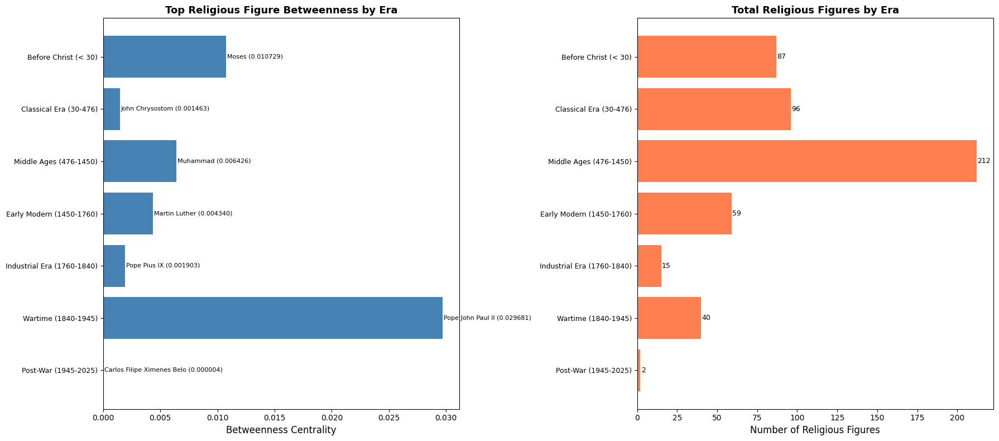


✓ Analysis complete!


In [21]:
# Find top religious figures by era
print("Top Religious Figures by Betweenness Centrality - By Era")
print("=" * 120)
def get_era(birth_year):
    """Determine which era a birth year belongs to"""
    if birth_year is None:
        return 'Unknown'
    
    try:
        year = int(birth_year)
    except (ValueError, TypeError):
        return 'Unknown'
    
    if year < 30:
        return 'Before Christ (< 30)'
    elif 30 <= year < 476:
        return 'Classical Era (30-476)'
    elif 476 <= year < 1450:
        return 'Middle Ages (476-1450)'
    elif 1450 <= year < 1760:
        return 'Early Modern (1450-1760)'
    elif 1760 <= year < 1840:
        return 'Industrial Era (1760-1840)'
    elif 1840 <= year < 1945:
        return 'Wartime (1840-1945)'
    elif 1945 <= year <= 2025:
        return 'Post-War (1945-2025)'
    else:
        return 'Unknown'
# Group religious figures by era
era_religious_figures = defaultdict(list)

for figure in religious_figures:
    node_id = figure['node_id']
    birthyear = network.nodes[node_id].get('birthyear', None)
    era = get_era(birthyear)
    
    if era != 'Unknown':
        era_religious_figures[era].append(figure)

# Sort by betweenness within each era
for era in era_religious_figures:
    era_religious_figures[era].sort(key=lambda x: x['betweenness'], reverse=True)

# Display top 5 for each era in chronological order
era_order_display = [
    'Before Christ (< 30)',
    'Classical Era (30-476)',
    'Middle Ages (476-1450)',
    'Early Modern (1450-1760)',
    'Industrial Era (1760-1840)',
    'Wartime (1840-1945)',
    'Post-War (1945-2025)'
]

for era in era_order_display:
    if era in era_religious_figures and len(era_religious_figures[era]) > 0:
        print(f"\n{era}")
        print("-" * 120)
        print(f"{'Rank':<6} {'Name':<40} {'Betweenness':<15} {'Birth Year':<12} {'Birth City':<30}")
        print("-" * 120)
        
        # Show top 5 (or fewer if less than 5 available)
        top_n = min(5, len(era_religious_figures[era]))
        for rank, figure in enumerate(era_religious_figures[era][:top_n], 1):
            print(f"{rank:<6} {figure['name']:<40} {figure['betweenness']:<15.6f} {figure['birthyear']:<12} {figure['birthcity']:<30}")
        
        print(f"\nTotal religious figures in this era: {len(era_religious_figures[era])}")

# Visualize top religious figure per era
top_per_era = []
for era in era_order_display:
    if era in era_religious_figures and len(era_religious_figures[era]) > 0:
        top_figure = era_religious_figures[era][0]
        top_per_era.append({
            'era': era,
            'name': top_figure['name'],
            'betweenness': top_figure['betweenness'],
            'count': len(era_religious_figures[era])
        })

if top_per_era:
    df_top_religious = pd.DataFrame(top_per_era)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # Plot 1: Top religious figure betweenness by era
    ax1.barh(range(len(df_top_religious)), df_top_religious['betweenness'], color='steelblue')
    ax1.set_yticks(range(len(df_top_religious)))
    ax1.set_yticklabels(df_top_religious['era'], fontsize=9)
    ax1.set_xlabel('Betweenness Centrality', fontsize=12)
    ax1.set_title('Top Religious Figure Betweenness by Era', fontsize=13, fontweight='bold')
    ax1.invert_yaxis()
    
    # Add names and values
    for i, (name, bc) in enumerate(zip(df_top_religious['name'], df_top_religious['betweenness'])):
        ax1.text(bc + 0.0001, i, f'{name} ({bc:.6f})', va='center', fontsize=8)
    
    # Plot 2: Total religious figures count by era
    ax2.barh(range(len(df_top_religious)), df_top_religious['count'], color='coral')
    ax2.set_yticks(range(len(df_top_religious)))
    ax2.set_yticklabels(df_top_religious['era'], fontsize=9)
    ax2.set_xlabel('Number of Religious Figures', fontsize=12)
    ax2.set_title('Total Religious Figures by Era', fontsize=13, fontweight='bold')
    ax2.invert_yaxis()
    
    # Add count labels
    for i, v in enumerate(df_top_religious['count']):
        ax2.text(v + 0.5, i, str(int(v)), va='center', fontsize=9)
    
    plt.tight_layout()
    plt.show()

print("\n✓ Analysis complete!")

In [24]:
# Create subgraph with only religious figure nodes
print("Creating subgraph with only RELIGIOUS FIGURE nodes...")

# Get all nodes with 'RELIGIOUS FIGURE' occupation
religious_nodes = []
for node in network.nodes():
    occupation = network.nodes[node].get('occupation', '')
    if occupation == 'RELIGIOUS FIGURE':
        religious_nodes.append(node)

print(f"  Found {len(religious_nodes)} religious figure nodes")

# Create subgraph
religious_subgraph = network.subgraph(religious_nodes).copy()

print(f"\n✓ Religious figures subgraph created!")
print(f"  Original network: {network.number_of_nodes()} nodes, {network.number_of_edges()} edges")
print(f"  Religious subgraph: {religious_subgraph.number_of_nodes()} nodes, {religious_subgraph.number_of_edges()} edges")

# Calculate betweenness centrality for the subgraph
print("\nCalculating betweenness centrality for religious subgraph...")
religious_betweenness = nx.betweenness_centrality(religious_subgraph)

# Get top 10 religious figures by betweenness in the subgraph
sorted_religious_bc = sorted(religious_betweenness.items(), key=lambda x: x[1], reverse=True)

print("\nTop 10 Religious Figures by Betweenness Centrality (in religious subgraph):")
print("=" * 100)
print(f"{'Rank':<6} {'Name':<40} {'Betweenness':<15} {'Birth City':<30}")
print("-" * 100)

for rank, (node, bc) in enumerate(sorted_religious_bc[:50], 1):
    name = religious_subgraph.nodes[node].get('Name', node)
    birthcity = religious_subgraph.nodes[node].get('birthcity', 'N/A')
    print(f"{rank:<6} {name:<40} {bc:<15.6f} {birthcity:<30}")

Creating subgraph with only RELIGIOUS FIGURE nodes...
  Found 511 religious figure nodes

✓ Religious figures subgraph created!
  Original network: 11286 nodes, 125705 edges
  Religious subgraph: 511 nodes, 2160 edges

Calculating betweenness centrality for religious subgraph...

Top 10 Religious Figures by Betweenness Centrality (in religious subgraph):
Rank   Name                                     Betweenness     Birth City                    
----------------------------------------------------------------------------------------------------
1      Saint Peter                              0.136510        BETHSAIDA                     
2      Pope John Paul II                        0.095545        WADOWICE                      
3      Pope Benedict XVI                        0.078634        MARKTL                        
4      Pope John XXIII                          0.059697        SOTTO IL MONTE GIOVANNI       
5      Moses                                    0.047369        WAD

In [27]:
# Create subgraph with Pope nodes and their direct neighbors
print("Creating subgraph with Pope nodes and their direct connections...")

# Find all nodes that contain 'Pope' in their name
pope_nodes = set()
for node in network.nodes():
    name = network.nodes[node].get('NameURL', '')
    if 'Pope' in name:
        pope_nodes.add(node)

print(f"  Found {len(pope_nodes)} nodes with 'Pope' in their name")

# Get all neighbors of Pope nodes
nodes_to_include = set(pope_nodes)
for pope_node in pope_nodes:
    neighbors = set(network.neighbors(pope_node))
    nodes_to_include.update(neighbors)

print(f"  Including {len(nodes_to_include) - len(pope_nodes)} directly connected nodes")

# Create subgraph
pope_subgraph = network.subgraph(nodes_to_include).copy()

print(f"\n✓ Pope subgraph created!")
print(f"  Original network: {network.number_of_nodes()} nodes, {network.number_of_edges()} edges")
print(f"  Pope subgraph: {pope_subgraph.number_of_nodes()} nodes, {pope_subgraph.number_of_edges()} edges")
print(f"  Pope nodes: {len(pope_nodes)}")
print(f"  Connected nodes: {len(nodes_to_include) - len(pope_nodes)}")

# Show some example Pope nodes
print("\nSample Pope nodes:")
for i, pope_node in enumerate(list(pope_nodes)[:10], 1):
    name = pope_subgraph.nodes[pope_node].get('Name', pope_node)
    birthyear = pope_subgraph.nodes[pope_node].get('birthyear', 'N/A')
    birthcity = pope_subgraph.nodes[pope_node].get('birthcity', 'N/A')
    print(f"  {i}. {name} (born {birthyear}, {birthcity})")

# Calculate betweenness centrality for the Pope subgraph
print("\nCalculating betweenness centrality for Pope subgraph...")
pope_betweenness = nx.betweenness_centrality(pope_subgraph)

# Get top 20 nodes by betweenness in the Pope subgraph
sorted_pope_bc = sorted(pope_betweenness.items(), key=lambda x: x[1], reverse=True)

print("\nTop 20 Nodes by Betweenness Centrality (in Pope subgraph):")
print("=" * 120)
print(f"{'Rank':<6} {'Name':<50} {'Betweenness':<15} {'Is Pope?':<10}")
print("-" * 120)

for rank, (node, bc) in enumerate(sorted_pope_bc[:20], 1):
    name = pope_subgraph.nodes[node].get('Name', node)
    is_pope = 'Yes' if node in pope_nodes else 'No'
    print(f"{rank:<6} {name:<50} {bc:<15.6f} {is_pope:<10}")

Creating subgraph with Pope nodes and their direct connections...
  Found 266 nodes with 'Pope' in their name
  Including 573 directly connected nodes

✓ Pope subgraph created!
  Original network: 11286 nodes, 125705 edges
  Pope subgraph: 839 nodes, 5928 edges
  Pope nodes: 266
  Connected nodes: 573

Sample Pope nodes:
  1. Pope Stephen IX (born 1020.0, LORRAINE)
  2. Pope Constantine (born 664.0, SYRIA)
  3. Pope Gregory IV (born 827.0, ROME)
  4. Pope Pius VIII (born 1761.0, CINGOLI)
  5. Pope Stephen II (born 715.0, ROME)
  6. Pope Silverius (born 486.0, FROSINONE)
  7. Pope Leo VII (born 880.0, ROME)
  8. Pope Clement VI (born 1291.0, ROSIERS-D'ÌäGLETONS)
  9. Pope Martin V (born 1368.0, GENAZZANO)
  10. Pope Stephen I (born 200.0, ROME)

Calculating betweenness centrality for Pope subgraph...

Top 20 Nodes by Betweenness Centrality (in Pope subgraph):
Rank   Name                                               Betweenness     Is Pope?  
--------------------------------------------

In [28]:
# Get top 20 non-Pope nodes by betweenness centrality in the Pope subgraph
non_pope_bc = [(node, bc) for node, bc in sorted_pope_bc if node not in pope_nodes]

print("\nTop 20 Non-Pope Nodes by Betweenness Centrality (in Pope subgraph):")
print("=" * 120)
print(f"{'Rank':<6} {'Name':<50} {'Betweenness':<15} {'Occupation':<30}")
print("-" * 120)

for rank, (node, bc) in enumerate(non_pope_bc[:20], 1):
    name = pope_subgraph.nodes[node].get('Name', node)
    occupation = pope_subgraph.nodes[node].get('occupation', 'N/A')
    birthcity = pope_subgraph.nodes[node].get('birthcity', 'N/A')
    print(f"{rank:<6} {name:<50} {bc:<15.6f} {occupation:<30}")


Top 20 Non-Pope Nodes by Betweenness Centrality (in Pope subgraph):
Rank   Name                                               Betweenness     Occupation                    
------------------------------------------------------------------------------------------------------------------------
1      Charlemagne                                        0.066087        POLITICIAN                    
2      Saint Peter                                        0.052902        RELIGIOUS FIGURE              
3      Augustine of Hippo                                 0.048933        PHILOSOPHER                   
4      Thomas Aquinas                                     0.046303        PHILOSOPHER                   
5      Bede                                               0.032960        HISTORIAN                     
6      Jesus Christ                                       0.031965        RELIGIOUS FIGURE              
7      Constantine I                                      0.030407        P

In [29]:
# Find the node(s) connected to the most nodes in the Pope subgraph
print("Finding nodes with highest degree (most connections) in Pope subgraph:")
print("=" * 120)

# Calculate degree for all nodes
node_degrees = dict(pope_subgraph.degree())

# Sort by degree
sorted_by_degree = sorted(node_degrees.items(), key=lambda x: x[1], reverse=True)

print(f"\n{'Rank':<6} {'Name':<50} {'Degree':<10} {'Is Pope?':<10} {'Occupation':<30}")
print("-" * 120)

for rank, (node, degree) in enumerate(sorted_by_degree[:20], 1):
    name = pope_subgraph.nodes[node].get('Name', node)
    is_pope = 'Yes' if node in pope_nodes else 'No'
    occupation = pope_subgraph.nodes[node].get('occupation', 'N/A')
    birthcity = pope_subgraph.nodes[node].get('birthcity', 'N/A')
    print(f"{rank:<6} {name:<50} {degree:<10} {is_pope:<10} {occupation:<30}")

# Check if there's a node connected to ALL nodes
max_degree = sorted_by_degree[0][1]
total_nodes = pope_subgraph.number_of_nodes()

print(f"\n{'='*120}")
print(f"Total nodes in Pope subgraph: {total_nodes}")
print(f"Maximum degree: {max_degree}")
print(f"Is there a node connected to all others? {'Yes' if max_degree == total_nodes - 1 else 'No'}")

Finding nodes with highest degree (most connections) in Pope subgraph:

Rank   Name                                               Degree     Is Pope?   Occupation                    
------------------------------------------------------------------------------------------------------------------------
1      Pope John Paul II                                  97         Yes        RELIGIOUS FIGURE              
2      Pope Pius XII                                      73         Yes        RELIGIOUS FIGURE              
3      Charlemagne                                        69         No         POLITICIAN                    
4      Augustine of Hippo                                 67         No         PHILOSOPHER                   
5      Saint Peter                                        62         No         RELIGIOUS FIGURE              
6      Pope Benedict XVI                                  59         Yes        RELIGIOUS FIGURE              
7      Thomas Aquinas         

In [30]:
# Find which non-Pope node is connected to the most Pope nodes
print("Finding nodes connected to the most Popes:")
print("=" * 120)

# For each non-Pope node, count how many Pope nodes it's connected to
non_pope_connections = {}

for node in pope_subgraph.nodes():
    if node not in pope_nodes:
        # Count connections to Pope nodes
        pope_connections = sum(1 for neighbor in pope_subgraph.neighbors(node) if neighbor in pope_nodes)
        if pope_connections > 0:
            non_pope_connections[node] = pope_connections

# Sort by number of Pope connections
sorted_connections = sorted(non_pope_connections.items(), key=lambda x: x[1], reverse=True)

print(f"\n{'Rank':<6} {'Name':<50} {'Pope Connections':<18} {'Occupation':<30}")
print("-" * 120)

for rank, (node, pope_conn) in enumerate(sorted_connections[:20], 1):
    name = pope_subgraph.nodes[node].get('Name', node)
    occupation = pope_subgraph.nodes[node].get('occupation', 'N/A')
    birthcity = pope_subgraph.nodes[node].get('birthcity', 'N/A')
    print(f"{rank:<6} {name:<50} {pope_conn:<18} {occupation:<30}")

# Check if any node is connected to ALL Popes
if sorted_connections:
    top_node, max_connections = sorted_connections[0]
    top_name = pope_subgraph.nodes[top_node].get('Name', top_node)
    print(f"\n{'='*120}")
    print(f"Total Pope nodes: {len(pope_nodes)}")
    print(f"Most connected node: {top_name} with {max_connections} Pope connections")
    print(f"Connected to all Popes? {'Yes' if max_connections == len(pope_nodes) else 'No'}")

Finding nodes connected to the most Popes:

Rank   Name                                               Pope Connections   Occupation                    
------------------------------------------------------------------------------------------------------------------------
1      Thomas Aquinas                                     10                 PHILOSOPHER                   
2      Anselm of Canterbury                               10                 RELIGIOUS FIGURE              
3      Bernard of Clairvaux                               10                 RELIGIOUS FIGURE              
4      Charles I of Naples                                9                  POLITICIAN                    
5      Robert Bellarmine                                  9                  PHYSICIAN                     
6      Henry II, Holy Roman Emperor                       8                  POLITICIAN                    
7      Hippolytus                                         8                  RE

In [32]:
# Find Desmond Tutu's node
desmond_tutu_node = None
for node in network.nodes():
    if network.nodes[node].get('Name') == 'Anselm of Canterbury':
        desmond_tutu_node = node
        break

if desmond_tutu_node:
    print(f"Found Desmond Tutu: {desmond_tutu_node}")
    print("\nNode attributes:")
    for key, value in network.nodes[desmond_tutu_node].items():
        print(f"  {key}: {value}")
    
    # Calculate betweenness centrality for all nodes
    print("\nCalculating betweenness centrality...")
    # betweenness = nx.betweenness_centrality(network)
    
    # Get Desmond Tutu's betweenness centrality
    tutu_betweenness = betweenness[desmond_tutu_node]
    
    print(f"\nDesmond Tutu's betweenness centrality: {tutu_betweenness:.6f}")
    
    # Find his rank among all nodes
    sorted_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)
    rank = next(i for i, (node, _) in enumerate(sorted_betweenness, 1) if node == desmond_tutu_node)
    
    print(f"Rank: {rank} out of {network.number_of_nodes()} nodes")
    
    # Show top 10 for comparison
    print("\nTop 10 nodes by betweenness centrality:")
    for i, (node, bc) in enumerate(sorted_betweenness[:10], 1):
        name = network.nodes[node].get('Name', node)
        print(f"{i:2d}. {name:<30s} - {bc:.6f}")
else:
    print("Desmond Tutu not found in the network")

Found Desmond Tutu: 4126

Node attributes:
  Name: Anselm of Canterbury
  NameURL: Anselm_of_Canterbury
  Link: https://en.wikipedia.org/wiki/Anselm_of_Canterbury
  birthcity: AOSTA
  countryName: ITALY
  continentName: EUROPE
  birthyear: 1033.0
  deathyear: 1109.0
  gender: Male
  occupation: RELIGIOUS FIGURE
  industry: RELIGION

Calculating betweenness centrality...

Desmond Tutu's betweenness centrality: 0.001235
Rank: 523 out of 11286 nodes

Top 10 nodes by betweenness centrality:
 1. Pope John Paul II              - 0.029681
 2. David Beckham                  - 0.027573
 3. Adolf Hitler                   - 0.015896
 4. Charlemagne                    - 0.015396
 5. George Bush                    - 0.014276
 6. Albert Einstein                - 0.014097
 7. Benito Mussolini               - 0.014091
 8. Vladimir Putin                 - 0.013293
 9. Pelé                           - 0.012835
10. Ronald Reagan                  - 0.012209


Nodes Connected to Most Popes - By Era

Before Christ (< 30)
------------------------------------------------------------------------------------------------------------------------
Rank   Name                                     Pope Conn.   Occupation                Birth City          
------------------------------------------------------------------------------------------------------------------------
1      Saint Peter                              7            RELIGIOUS FIGURE          BETHSAIDA           
2      Paul of Tarsus                           4            RELIGIOUS FIGURE          TARSUS              
3      Saint Joseph                             4            RELIGIOUS FIGURE          BETHLEHEM           
4      Saint Andrew                             3            RELIGIOUS FIGURE          BETHSAIDA           
5      Mary Magdalene                           3            RELIGIOUS FIGURE          MAGDALA             
6      Mary                                     3

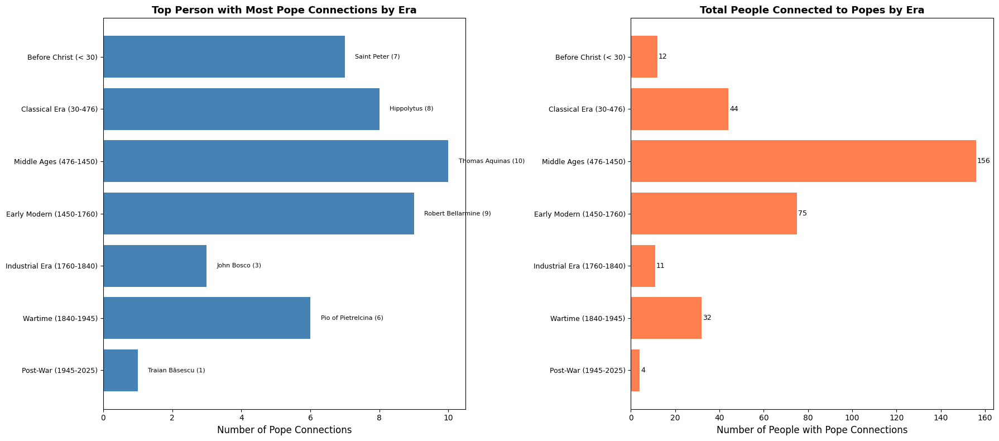


✓ Analysis complete!


In [33]:
# Find nodes connected to most Popes, grouped by era
print("Nodes Connected to Most Popes - By Era")
print("=" * 120)

# Group non-Pope nodes by era based on their connections to Popes
era_pope_connections = defaultdict(list)

for node in pope_subgraph.nodes():
    if node not in pope_nodes:
        # Count connections to Pope nodes
        pope_connections = sum(1 for neighbor in pope_subgraph.neighbors(node) if neighbor in pope_nodes)
        if pope_connections > 0:
            birthyear = pope_subgraph.nodes[node].get('birthyear', None)
            era = get_era(birthyear)
            
            if era != 'Unknown':
                era_pope_connections[era].append({
                    'node': node,
                    'name': pope_subgraph.nodes[node].get('Name', node),
                    'pope_connections': pope_connections,
                    'occupation': pope_subgraph.nodes[node].get('occupation', 'N/A'),
                    'birthcity': pope_subgraph.nodes[node].get('birthcity', 'N/A'),
                    'birthyear': pope_subgraph.nodes[node].get('birthyear', 'N/A')
                })

# Sort within each era
for era in era_pope_connections:
    era_pope_connections[era].sort(key=lambda x: x['pope_connections'], reverse=True)

# Display top nodes for each era
era_order_display = [
    'Before Christ (< 30)',
    'Classical Era (30-476)',
    'Middle Ages (476-1450)',
    'Early Modern (1450-1760)',
    'Industrial Era (1760-1840)',
    'Wartime (1840-1945)',
    'Post-War (1945-2025)'
]

for era in era_order_display:
    if era in era_pope_connections and len(era_pope_connections[era]) > 0:
        print(f"\n{era}")
        print("-" * 120)
        print(f"{'Rank':<6} {'Name':<40} {'Pope Conn.':<12} {'Occupation':<25} {'Birth City':<20}")
        print("-" * 120)
        
        # Show top 10 (or fewer if less available)
        top_n = min(10, len(era_pope_connections[era]))
        for rank, person in enumerate(era_pope_connections[era][:top_n], 1):
            print(f"{rank:<6} {person['name']:<40} {person['pope_connections']:<12} {person['occupation']:<25} {person['birthcity']:<20}")
        
        print(f"\nTotal non-Pope nodes with Pope connections in this era: {len(era_pope_connections[era])}")

# Visualize top person per era with most Pope connections
top_per_era = []
for era in era_order_display:
    if era in era_pope_connections and len(era_pope_connections[era]) > 0:
        top_person = era_pope_connections[era][0]
        top_per_era.append({
            'era': era,
            'name': top_person['name'],
            'pope_connections': top_person['pope_connections'],
            'count': len(era_pope_connections[era])
        })

if top_per_era:
    df_top_pope_conn = pd.DataFrame(top_per_era)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
    
    # Plot 1: Top person's Pope connections by era
    ax1.barh(range(len(df_top_pope_conn)), df_top_pope_conn['pope_connections'], color='steelblue')
    ax1.set_yticks(range(len(df_top_pope_conn)))
    ax1.set_yticklabels(df_top_pope_conn['era'], fontsize=9)
    ax1.set_xlabel('Number of Pope Connections', fontsize=12)
    ax1.set_title('Top Person with Most Pope Connections by Era', fontsize=13, fontweight='bold')
    ax1.invert_yaxis()
    
    # Add names and values
    for i, (name, conn) in enumerate(zip(df_top_pope_conn['name'], df_top_pope_conn['pope_connections'])):
        ax1.text(conn + 0.3, i, f'{name} ({conn})', va='center', fontsize=8)
    
    # Plot 2: Total people with Pope connections by era
    ax2.barh(range(len(df_top_pope_conn)), df_top_pope_conn['count'], color='coral')
    ax2.set_yticks(range(len(df_top_pope_conn)))
    ax2.set_yticklabels(df_top_pope_conn['era'], fontsize=9)
    ax2.set_xlabel('Number of People with Pope Connections', fontsize=12)
    ax2.set_title('Total People Connected to Popes by Era', fontsize=13, fontweight='bold')
    ax2.invert_yaxis()
    
    # Add count labels
    for i, v in enumerate(df_top_pope_conn['count']):
        ax2.text(v + 0.5, i, str(int(v)), va='center', fontsize=9)
    
    plt.tight_layout()
    plt.show()

print("\n✓ Analysis complete!")